#Finger Spelling code (using tensorflow1)

## Import Tensorflow and other libraries

In [ ]:
%tensorflow_version 1.x
import tensorflow as tf
print(tf.__version__)

# Load the TensorBoard notebook extension
%load_ext tensorboard

import pandas as pd
import numpy as np
import seaborn as sn
from matplotlib import pyplot as plt
import math
from PIL import Image

1.15.2
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


# Part A (make data ready)

In [ ]:
# import data
df = pd.read_csv (r'./drive/MyDrive/Q1_train.csv') # -> update the path base on the system you run
df = df.astype('float32')

# standardize pixels data [0 255] -> [0 1]
for label in df.columns[1:]:
    df[label] = df[label]/255

# We can sort by label column
# df = df.sort_values(by=['label'])
df

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,...,pixel745,pixel746,pixel747,pixel748,pixel749,pixel750,pixel751,pixel752,pixel753,pixel754,pixel755,pixel756,pixel757,pixel758,pixel759,pixel760,pixel761,pixel762,pixel763,pixel764,pixel765,pixel766,pixel767,pixel768,pixel769,pixel770,pixel771,pixel772,pixel773,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,3.0,0.419608,0.462745,0.498039,0.525490,0.545098,0.560784,0.572549,0.588235,0.600000,0.611765,0.619608,0.627451,0.639216,0.647059,0.623529,0.650980,0.658824,0.666667,0.666667,0.670588,0.670588,0.670588,0.674510,0.670588,0.670588,0.666667,0.666667,0.662745,0.435294,0.474510,0.505882,0.529412,0.552941,0.564706,0.580392,0.592157,0.603922,0.615686,0.627451,...,0.803922,0.807843,0.807843,0.811765,0.811765,0.807843,0.807843,0.800000,0.803922,0.800000,0.796078,0.792157,0.556863,0.592157,0.627451,0.674510,0.768627,0.737255,0.737255,0.745098,0.529412,0.376471,0.337255,0.301961,0.301961,0.309804,0.690196,0.803922,0.811765,0.811765,0.811765,0.811765,0.811765,0.811765,0.807843,0.807843,0.807843,0.800000,0.796078,0.792157
1,6.0,0.607843,0.615686,0.611765,0.611765,0.611765,0.615686,0.611765,0.619608,0.619608,0.615686,0.619608,0.611765,0.603922,0.603922,0.600000,0.596078,0.592157,0.584314,0.584314,0.580392,0.576471,0.572549,0.564706,0.556863,0.560784,0.541176,0.360784,0.423529,0.619608,0.623529,0.623529,0.623529,0.627451,0.627451,0.627451,0.627451,0.627451,0.627451,0.627451,...,0.392157,0.305882,0.470588,0.615686,0.658824,0.419608,0.388235,0.474510,0.521569,0.380392,0.372549,0.470588,0.529412,0.454902,0.372549,0.309804,0.270588,0.337255,0.545098,0.678431,0.784314,0.725490,0.686275,0.776471,0.486275,0.462745,0.368627,0.549020,0.521569,0.329412,0.270588,0.584314,0.501961,0.341176,0.368627,0.639216,0.686275,0.403922,0.529412,0.584314
2,2.0,0.733333,0.737255,0.737255,0.733333,0.733333,0.729412,0.733333,0.737255,0.733333,0.729412,0.725490,0.725490,0.725490,0.721569,0.721569,0.721569,0.709804,0.709804,0.701961,0.701961,0.701961,0.698039,0.698039,0.427451,0.203922,0.258824,0.301961,0.325490,0.737255,0.741176,0.741176,0.737255,0.737255,0.741176,0.737255,0.737255,0.737255,0.737255,0.733333,...,0.796078,0.800000,0.796078,0.788235,0.784314,0.784314,0.780392,0.776471,0.768627,0.764706,0.760784,0.756863,0.776471,0.650980,0.517647,0.447059,0.349020,0.290196,0.309804,0.301961,0.290196,0.305882,0.517647,0.737255,0.823529,0.819608,0.807843,0.803922,0.800000,0.796078,0.792157,0.788235,0.784314,0.780392,0.776471,0.780392,0.776471,0.764706,0.760784,0.764706
3,2.0,0.827451,0.827451,0.831373,0.831373,0.827451,0.823529,0.827451,0.823529,0.823529,0.827451,0.819608,0.811765,0.815686,0.811765,0.807843,0.796078,0.792157,0.788235,0.784314,0.776471,0.772549,0.764706,0.752941,0.772549,0.670588,0.200000,0.203922,0.211765,0.831373,0.835294,0.843137,0.843137,0.831373,0.831373,0.835294,0.831373,0.831373,0.827451,0.827451,...,0.968627,0.949020,0.913725,0.905882,0.901961,0.898039,0.890196,0.882353,0.874510,0.866667,0.862745,0.847059,0.227451,0.200000,0.192157,0.196078,0.223529,0.235294,0.066667,0.058824,0.070588,0.066667,0.074510,0.003922,0.623529,1.000000,0.929412,0.937255,0.929412,0.925490,0.921569,0.917647,0.913725,0.905882,0.901961,0.886275,0.882353,0.870588,0.898039,0.639216
4,13.0,0.643137,0.654902,0.666667,0.674510,0.690196,0.701961,0.705882,0.721569,0.725490,0.729412,0.737255,0.741176,0.741176,0.745098,0.749020,0.741176,0.745098,0.745098,0.733333,0.745098,0.752941,0.756863,0.749020,0.749020,0.752941,0.752941,0.760784,0.760784,0.650980,0.662745,0.674510,0.682353,0.694118,0.705882,0.713726,0.725490,0.729412,0.733333,0.745098,...,0.352941,0.301961,0.345098,0.458824,0.482353,0.498039,0.505882,0.525490,0.568627

No N = 9 Found


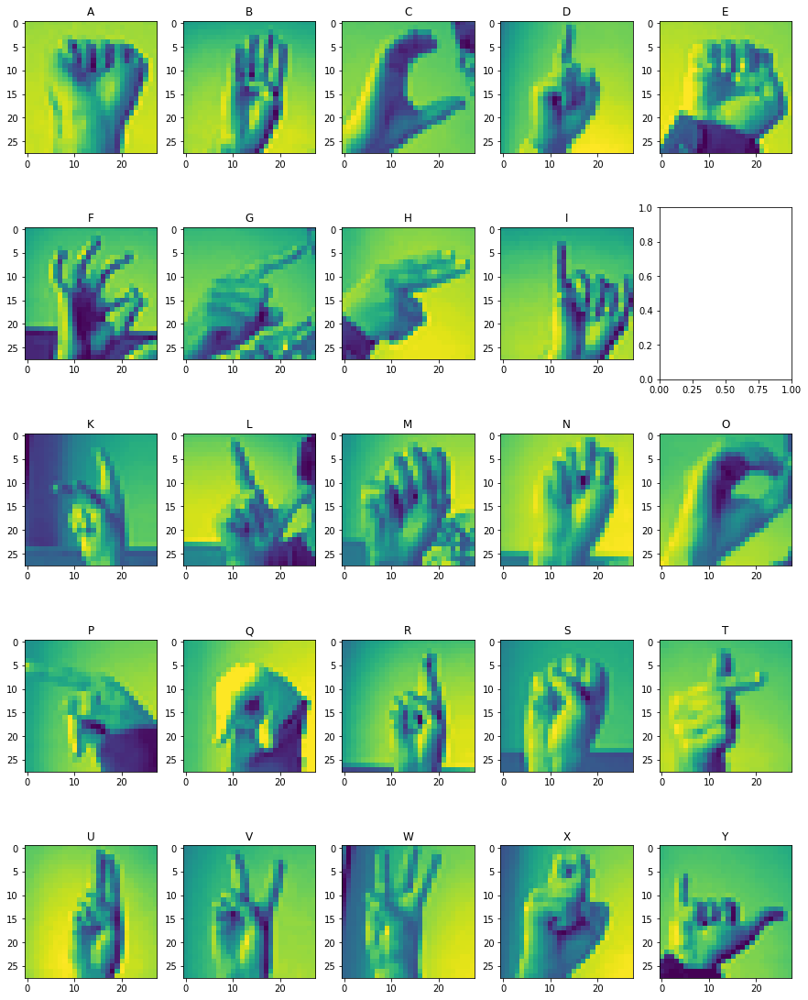

In [ ]:
# draw each label picture
plt.figure(figsize=(15,20))

for i in range(25):
  plt.subplot(5, 5, i+1)
  s = df[df['label'] == i].head(1)
  if len(s) != 0:
    s = s.to_numpy()
    sr = s[0, 1::].reshape(28,28)
    plt.title(chr(65+i))
    plt.imshow(sr)
  else:
    print('No N =', i, 'Found')

plt.show()

Part B (Traing MLP with SGD and ADAM algorithms)
Part C (Loss curve)

In [ ]:
ls

drive/  sample_data/


In [ ]:
# Load test data and convert training data to numpy format
x_train = df[df.columns[1:]].to_numpy()
y_train = df[df.columns[0]].to_numpy()

df = pd.read_csv (r'./drive/MyDrive/Q1_test.csv')
x_test = df[df.columns[1:]].to_numpy()
y_test = df[df.columns[0]].to_numpy()


In [ ]:
# Train/Test/Valid & One Hot

validation_ratio = 0.3

num_test=x_test.shape[0]
num_valid=int(validation_ratio*x_train.shape[0])
num_train=x_train.shape[0]-num_valid

x_valid=x_train[num_train:]
y_valid=y_train[num_train:]

x_train=x_train[0:num_train]
y_train=y_train[0:num_train]

y_train_hot=tf.Session().run(tf.one_hot(y_train,25))
y_valid_hot=tf.Session().run(tf.one_hot(y_valid,25))
y_test_hot=tf.Session().run(tf.one_hot(y_test,25))
tf.Session().close()

In [ ]:
# shuffle
x_train_shaffle=tf.Session().run(tf.random.shuffle(x_train, seed=12345 ))
y_train_shaffle=tf.Session().run(tf.random.shuffle(y_train_hot, seed=12345))

In [ ]:
# normalize
x_train_shaffle_normalized = (x_train_shaffle- np.mean(x_train_shaffle, axis=0)) / (1e-3 + np.sqrt(np.var(x_train_shaffle, axis=0)))
x_valid_normalized = (x_valid- np.mean(x_valid, axis=0)) / (1e-3 + np.sqrt(np.var(x_valid, axis=0)))
x_test_normalized = (x_test- np.mean(x_test, axis=0)) / (1e-3 + np.sqrt(np.var(x_test, axis=0)))

## SGD

In [ ]:
# Hyperparameters
num_class=25
lr=0.05
batchsize=20
normal_std=0.01

In [ ]:
tf.reset_default_graph()

# LAYER 1 
# INPUT = 784 -> 200
image=tf.placeholder(shape=(None,784), dtype=tf.float32, name='Imgaes')

W1=tf.get_variable(shape=(784,200), name='Weight_1',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b1=tf.get_variable(shape=(200), name='Bias_1',
                  initializer=tf.zeros_initializer())

h1=tf.matmul(image,W1,name='Hidden_1')
O1=tf.nn.relu(tf.add(h1,b1, name='Output_1'), name='Relu1')

# LAYER 2
# HIDDEN = 200 -> 25
W2=tf.get_variable(shape=(200,num_class), name='Weight_2',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b2=tf.get_variable(shape=(num_class), name='Bias_2',
                  initializer=tf.zeros_initializer())
h2=tf.matmul(O1,W2,name='Hidden_2')
O2=tf.add(h2,b2, name='Output_2')


output=tf.placeholder(dtype=tf.float32, shape=(None, num_class),
                           name='OUTPUT')

tf.summary.FileWriter('./drive/MyDrive/graphs/sgd', tf.get_default_graph())

In [ ]:
# SGD
loss= tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=output, logits= O2,
                                            name='LOSS'))
sgd=tf.train.GradientDescentOptimizer (
    learning_rate=lr, name='SGD'
).minimize(loss)

# Session Phase
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

# Summerizing the results
write = tf.summary.FileWriter('./drive/MyDrive/graphs/sgd', sess.graph)

weights1_sum=tf.summary.histogram ('histogram of weights layer 1', W1)
weights2_sum=tf.summary.histogram ('histogram of weights layer 2', W2)
loss_sum1= tf.summary.scalar('Training Loss', loss)
loss_sum2= tf.summary.scalar('Validation Loss', loss)

for epoch in range(0,100):
    print('==================================================')
    print('====== Epoch=%s =================================== ' %(epoch))
    print('==================================================')
    for i in range(math.floor(num_train/batchsize)):
        x_temp = x_train_shaffle_normalized[i*batchsize : (i+1)*batchsize]
        x_temp_normalized = (x_temp- np.mean(x_temp, axis=0)) / (1e-3 + np.sqrt(np.var(x_temp, axis=0)))
        f={image:x_temp_normalized,
          output:y_train_shaffle[i*batchsize : (i+1)*batchsize] }
        sess.run(sgd,feed_dict=f)
        print('iter {}: \t Loss={:.4f}'.format(i,sess.run(loss,feed_dict=f)))
    f_valid={image:x_valid_normalized , 
            output:y_valid_hot}
    print('--------------------------------------------------')
    print('Epoch:{} \t Validation Loss:{:.4f} '.format(epoch,sess.run(loss,feed_dict=f_valid)))
    print('--------------------------------------------------')

    # summerize Loss on traing, validation and test, Distrubition of network weights 

    # Training
    f={image:x_train_shaffle_normalized, 
          output:y_train_shaffle}
    write.add_summary(sess.run(loss_sum1, feed_dict=f),epoch)

    # Validation
    f={image:x_valid_normalized, 
          output:y_valid_hot}
    write.add_summary(sess.run(loss_sum2, feed_dict=f),epoch)

    #write.add_summary(sess.run(summaries, tf.summary.scalar('Validation Loss', sess.run(loss,feed_dict=f))),epoch)

    write.add_summary(sess.run(weights1_sum),epoch)
    write.add_summary(sess.run(weights2_sum),epoch)


# Save the trained model
saver = tf.train.Saver()
saver.save(sess, './drive/MyDrive/graphs/sgd/sgd_model.ckpt')

INFO:tensorflow:Summary name histogram of weights layer 1 is illegal; using histogram_of_weights_layer_1 instead.
INFO:tensorflow:Summary name histogram of weights layer 2 is illegal; using histogram_of_weights_layer_2 instead.
INFO:tensorflow:Summary name Training Loss is illegal; using Training_Loss instead.
INFO:tensorflow:Summary name Validation Loss is illegal; using Validation_Loss instead.


/tensorflow-1.15.2/python3.7/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


Streaming output truncated to the last 5000 lines.
iter 17: 	 Loss=0.0005
iter 18: 	 Loss=0.0004
iter 19: 	 Loss=0.0011
iter 20: 	 Loss=0.0005
iter 21: 	 Loss=0.0011
iter 22: 	 Loss=0.0007
iter 23: 	 Loss=0.0005
iter 24: 	 Loss=0.0004
iter 25: 	 Loss=0.0013
iter 26: 	 Loss=0.0003
iter 27: 	 Loss=0.0003
iter 28: 	 Loss=0.0003
iter 29: 	 Loss=0.0009
iter 30: 	 Loss=0.0005
iter 31: 	 Loss=0.0009
iter 32: 	 Loss=0.0005
iter 33: 	 Loss=0.0009
iter 34: 	 Loss=0.0005
iter 35: 	 Loss=0.0005
iter 36: 	 Loss=0.0011
iter 37: 	 Loss=0.0006
iter 38: 	 Loss=0.0011
iter 39: 	 Loss=0.0007
iter 40: 	 Loss=0.0012
iter 41: 	 Loss=0.0004
iter 42: 	 Loss=0.0004
iter 43: 	 Loss=0.0002
iter 44: 	 Loss=0.0007
iter 45: 	 Loss=0.0003
iter 46: 	 Loss=0.0012
iter 47: 	 Loss=0.0011
iter 48: 	 Loss=0.0006
iter 49: 	 Loss=0.0004
iter 50: 	 Loss=0.0011
iter 51: 	 Loss=0.0005
iter 52: 	 Loss=0.0011
iter 53: 	 Loss=0.0003
iter 54: 	 Loss=0.0005
iter 55: 	 Loss=0.0004
iter 56: 	 Loss=0.0010
iter 57: 	 Loss=0.0004
iter 5

'./drive/MyDrive/graphs/sgd/sgd_model.ckpt'

In [ ]:
!kill 2121
%tensorboard --logdir ./drive/MyDrive/graphs/sgd

INFO:tensorflow:Restoring parameters from ./drive/MyDrive/graphs/sgd/sgd_model.ckpt
SGD Validation Accuracy =  1.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()


SGD Test Accuracy =  1.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide


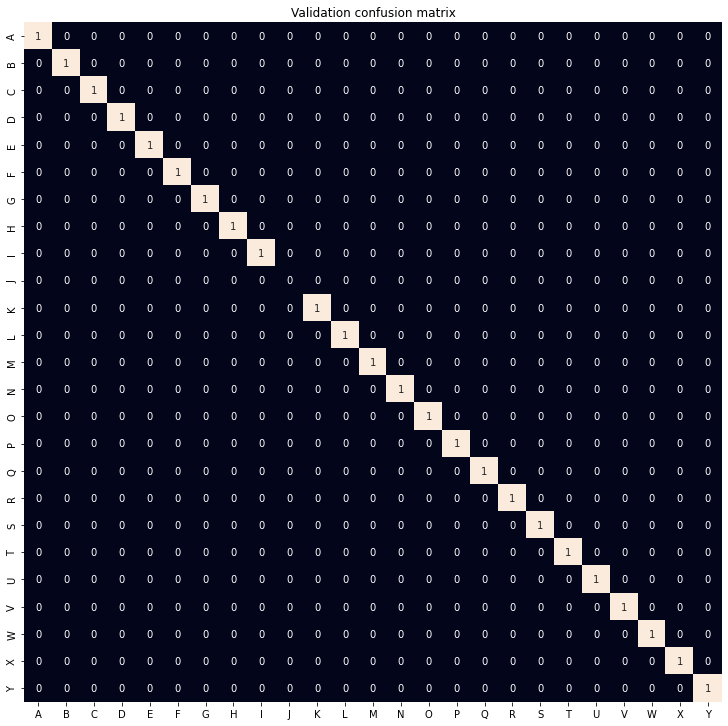

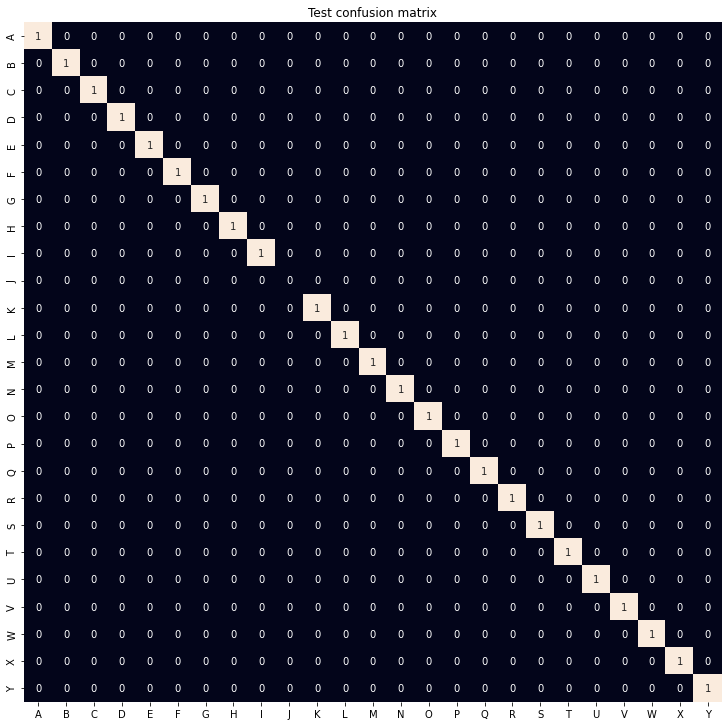

In [ ]:
# Calculate the model accuracy and draw confusion matrix for validation and 
saved_model = saver.restore(sess, './drive/MyDrive/graphs/sgd/sgd_model.ckpt')

#validation data
plt.figure(figsize=(12.5, 12.5))
plt.title('Validation confusion matrix')

f = {image: x_valid_normalized,
     output: y_valid_hot}

y_valid_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
valid_accuracy = np.mean(np.where(y_valid==y_valid_predicted, 1, 0))
print('SGD Validation Accuracy = ', valid_accuracy)

cm_valid = tf.math.confusion_matrix(y_valid, y_valid_predicted, num_class).eval().astype(np.float64)
cm_valid /= cm_valid.sum(axis=1)[:,np.newaxis]
cm_valid = np.where(np.isnan(cm_valid), 0, cm_valid)
df = pd.DataFrame(cm_valid, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)


#test data
plt.figure(figsize=(12.5, 12.5))
plt.title('Test confusion matrix')

f = {image: x_test_normalized,
     output: y_test_hot}

y_test_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
test_accuracy = np.mean(np.where(y_test==y_test_predicted, 1, 0))
print('SGD Test Accuracy = ', test_accuracy)

cm_test = tf.math.confusion_matrix(y_test, y_test_predicted, num_class).eval().astype(np.float64)
cm_test /= cm_test.sum(axis=1)[:,np.newaxis]
cm_test = np.where(np.isnan(cm_test), 0, cm_test)
df = pd.DataFrame(cm_test, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

##ADAM

In [ ]:
# Hyperparameters
num_class=25
lr=0.05
batchsize=20
normal_std=0.01

In [ ]:
tf.reset_default_graph()

# LAYER 1 
# INPUT = 784 -> 200
image=tf.placeholder(shape=(None,784), dtype=tf.float32, name='Imgaes')

W1=tf.get_variable(shape=(784,200), name='Weight_1',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b1=tf.get_variable(shape=(200), name='Bias_1',
                  initializer=tf.zeros_initializer())

h1=tf.matmul(image,W1,name='Hidden_1')
O1=tf.nn.relu(tf.add(h1,b1, name='Output_1'), name='Relu1')

# LAYER 2
# HIDDEN = 200 -> 25
W2=tf.get_variable(shape=(200,num_class), name='Weight_2',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b2=tf.get_variable(shape=(num_class), name='Bias_2',
                  initializer=tf.zeros_initializer())
h2=tf.matmul(O1,W2,name='Hidden_2')
O2=tf.add(h2,b2, name='Output_2')


output=tf.placeholder(dtype=tf.float32, shape=(None, num_class),
                           name='OUTPUT')

tf.summary.FileWriter('./drive/MyDrive/graphs/adam', tf.get_default_graph())

In [ ]:
# ADAM
loss= tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=output, logits= O2,
                                            name='LOSS'))
adam=tf.train.AdamOptimizer (
    learning_rate=lr, name='ADAM'
).minimize(loss)

# Session Phase
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

# Summerizing the results
write = tf.summary.FileWriter('./drive/MyDrive/graphs/adam', sess.graph)

weights1_sum=tf.summary.histogram ('histogram of weights layer 1', W1)
weights2_sum=tf.summary.histogram ('histogram of weights layer 2', W2)
loss_sum1= tf.summary.scalar('Training Loss', loss)
loss_sum2= tf.summary.scalar('Validation Loss', loss)

for epoch in range(0,100):
    print('==================================================')
    print('====== Epoch=%s =================================== ' %(epoch))
    print('==================================================')
    for i in range(math.floor(num_train/batchsize)):
        x_temp = x_train_shaffle_normalized[i*batchsize : (i+1)*batchsize]
        x_temp_normalized = (x_temp- np.mean(x_temp, axis=0)) / (1e-3 + np.sqrt(np.var(x_temp, axis=0)))
        f={image:x_temp_normalized,
          output:y_train_shaffle[i*batchsize : (i+1)*batchsize] }
        sess.run(adam,feed_dict=f)
        print('iter {}: \t Loss={:.4f}'.format(i,sess.run(loss,feed_dict=f)))
    f_valid={image:x_valid_normalized , 
            output:y_valid_hot}
    print('--------------------------------------------------')
    print('Epoch:{} \t Validation Loss:{:.4f} '.format(epoch,sess.run(loss,feed_dict=f_valid)))
    print('--------------------------------------------------')

    # summerize Loss on traing, validation and test, Distrubition of network weights 

    # Training
    f={image:x_train_shaffle_normalized, 
          output:y_train_shaffle}
    write.add_summary(sess.run(loss_sum1, feed_dict=f),epoch)

    # Validation
    f={image:x_valid_normalized, 
          output:y_valid_hot}
    write.add_summary(sess.run(loss_sum2, feed_dict=f),epoch)

    #write.add_summary(sess.run(summaries, tf.summary.scalar('Validation Loss', sess.run(loss,feed_dict=f))),epoch)

    write.add_summary(sess.run(weights1_sum),epoch)
    write.add_summary(sess.run(weights2_sum),epoch)


# Save the trained model
saver = tf.train.Saver()
saver.save(sess, './drive/MyDrive/graphs/adam/adam_model.ckpt')

INFO:tensorflow:Summary name histogram of weights layer 1 is illegal; using histogram_of_weights_layer_1 instead.
INFO:tensorflow:Summary name histogram of weights layer 2 is illegal; using histogram_of_weights_layer_2 instead.
INFO:tensorflow:Summary name Training Loss is illegal; using Training_Loss instead.
INFO:tensorflow:Summary name Validation Loss is illegal; using Validation_Loss instead.


/tensorflow-1.15.2/python3.7/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


Streaming output truncated to the last 5000 lines.
iter 137: 	 Loss=0.0000
iter 138: 	 Loss=0.0000
iter 139: 	 Loss=0.0000
iter 140: 	 Loss=0.0000
iter 141: 	 Loss=0.0000
iter 142: 	 Loss=0.0000
iter 143: 	 Loss=0.0000
iter 144: 	 Loss=0.0000
iter 145: 	 Loss=0.0000
iter 146: 	 Loss=0.0000
iter 147: 	 Loss=0.0000
iter 148: 	 Loss=0.0000
iter 149: 	 Loss=0.0000
iter 150: 	 Loss=0.0000
iter 151: 	 Loss=0.0000
iter 152: 	 Loss=0.0000
iter 153: 	 Loss=0.0000
iter 154: 	 Loss=0.0000
iter 155: 	 Loss=0.0000
iter 156: 	 Loss=0.0000
iter 157: 	 Loss=0.0000
iter 158: 	 Loss=0.0000
iter 159: 	 Loss=0.0000
iter 160: 	 Loss=0.0000
iter 161: 	 Loss=0.0000
iter 162: 	 Loss=0.0000
iter 163: 	 Loss=0.0000
iter 164: 	 Loss=0.0000
iter 165: 	 Loss=0.0000
iter 166: 	 Loss=0.0000
iter 167: 	 Loss=0.0000
iter 168: 	 Loss=0.0000
iter 169: 	 Loss=0.0000
iter 170: 	 Loss=0.0000
iter 171: 	 Loss=0.0000
iter 172: 	 Loss=0.0000
iter 173: 	 Loss=0.0000
iter 174: 	 Loss=0.0000
iter 175: 	 Loss=0.0000
iter 176: 	 L

'./drive/MyDrive/graphs/adam/adam_model.ckpt'

In [ ]:
!kill 2121
%tensorboard --logdir ./drive/MyDrive/graphs/adam

/bin/bash: line 0: kill: (2121) - No such process


INFO:tensorflow:Restoring parameters from ./drive/MyDrive/graphs/adam/adam_model.ckpt
ADAM Validation Accuracy =  1.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()


ADAM Test Accuracy =  1.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide


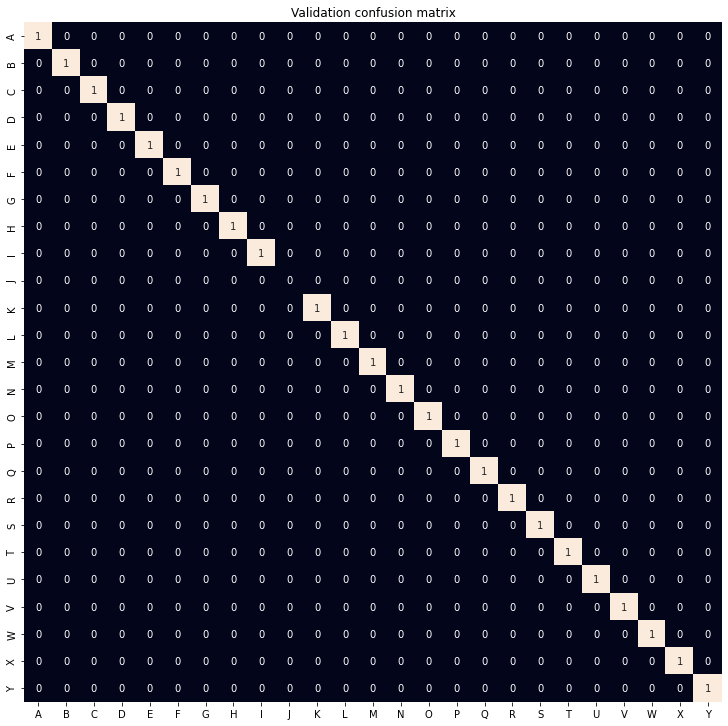

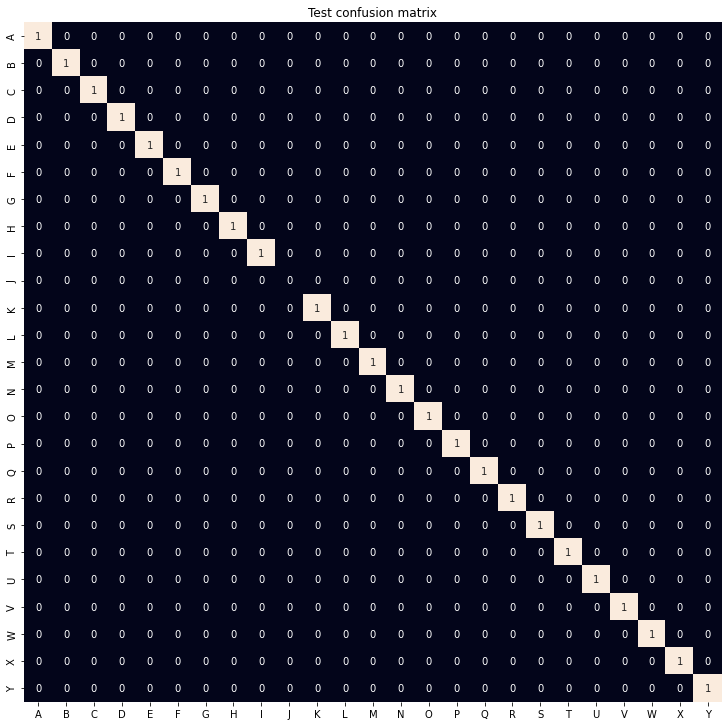

In [ ]:
# Calculate the model accuracy and draw confusion matrix for validation and 
saved_model = saver.restore(sess, './drive/MyDrive/graphs/adam/adam_model.ckpt')

#validation data
plt.figure(figsize=(12.5, 12.5))
plt.title('Validation confusion matrix')

f = {image: x_valid_normalized,
     output: y_valid_hot}

y_valid_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
valid_accuracy = np.mean(np.where(y_valid==y_valid_predicted, 1, 0))
print('ADAM Validation Accuracy = ', valid_accuracy)

cm_valid = tf.math.confusion_matrix(y_valid, y_valid_predicted, num_class).eval().astype(np.float64)
cm_valid /= cm_valid.sum(axis=1)[:,np.newaxis]
cm_valid = np.where(np.isnan(cm_valid), 0, cm_valid)
df = pd.DataFrame(cm_valid, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)


#test data
plt.figure(figsize=(12.5, 12.5))
plt.title('Test confusion matrix')

f = {image: x_test_normalized,
     output: y_test_hot}

y_test_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
test_accuracy = np.mean(np.where(y_test==y_test_predicted, 1, 0))
print('ADAM Test Accuracy = ', test_accuracy)

cm_test = tf.math.confusion_matrix(y_test, y_test_predicted, num_class).eval().astype(np.float64)
cm_test /= cm_test.sum(axis=1)[:,np.newaxis]
cm_test = np.where(np.isnan(cm_test), 0, cm_test)
df = pd.DataFrame(cm_test, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

# Part D (Add Dropout)

From this part, to see the change result we try to reduce our normal sgd network accuracy by increasing batchsize and run network just  5 epoches 

### SGD with 5 epoches and Incresed batchsize

INFO:tensorflow:Summary name histogram of weights layer 1 is illegal; using histogram_of_weights_layer_1 instead.
INFO:tensorflow:Summary name histogram of weights layer 2 is illegal; using histogram_of_weights_layer_2 instead.
INFO:tensorflow:Summary name Training Loss is illegal; using Training_Loss instead.
INFO:tensorflow:Summary name Validation Loss is illegal; using Validation_Loss instead.


/tensorflow-1.15.2/python3.7/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


====== Epoch=0 =================================== 
iter 0: 	 Loss=3.2023
iter 1: 	 Loss=3.1978
iter 2: 	 Loss=3.1954
iter 3: 	 Loss=3.1860
iter 4: 	 Loss=3.1929
iter 5: 	 Loss=3.1831
iter 6: 	 Loss=3.1843
iter 7: 	 Loss=3.1815
iter 8: 	 Loss=3.1853
iter 9: 	 Loss=3.1676
iter 10: 	 Loss=3.1670
iter 11: 	 Loss=3.1615
iter 12: 	 Loss=3.1383
iter 13: 	 Loss=3.1537
iter 14: 	 Loss=3.1612
iter 15: 	 Loss=3.1464
iter 16: 	 Loss=3.1262
iter 17: 	 Loss=3.1259
iter 18: 	 Loss=3.1266
iter 19: 	 Loss=3.1041
iter 20: 	 Loss=3.1089
iter 21: 	 Loss=3.0777
iter 22: 	 Loss=3.0321
iter 23: 	 Loss=3.0095
iter 24: 	 Loss=3.0472
iter 25: 	 Loss=3.0346
iter 26: 	 Loss=3.0080
iter 27: 	 Loss=3.0356
iter 28: 	 Loss=3.0087
iter 29: 	 Loss=2.9730
iter 30: 	 Loss=2.9644
iter 31: 	 Loss=2.9887
iter 32: 	 Loss=2.9953
iter 33: 	 Loss=2.9197
iter 34: 	 Loss=2.9531
iter 35: 	 Loss=3.0127
iter 36: 	 Loss=2.8490
iter 37: 	 Loss=2.9748
iter 38: 	 Loss=2.8740
iter 39: 	 Loss=2.8994
iter 40: 	 Loss=2.7938
iter 41: 	 Loss

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:111: RuntimeWarning: invalid value encountered in true_divide


SGD 5 Validation Accuracy =  0.898186889818689


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:128: RuntimeWarning: invalid value encountered in true_divide


SGD 5 Test Accuracy =  0.9040713887339654


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:146: RuntimeWarning: invalid value encountered in true_divide


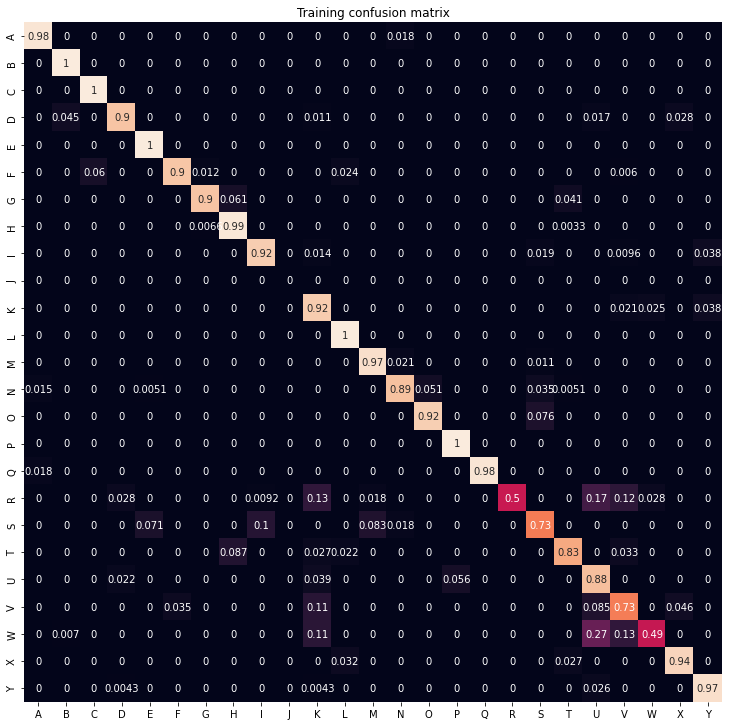

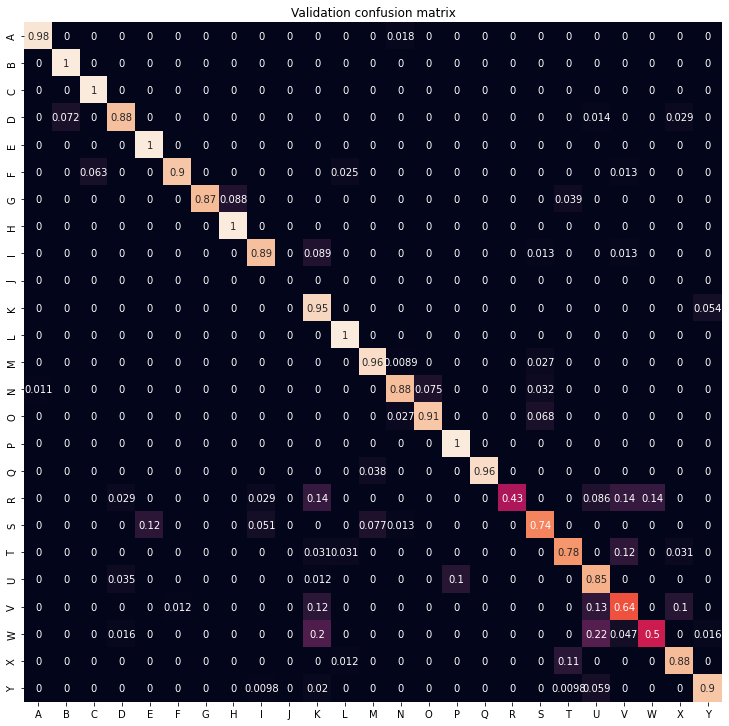

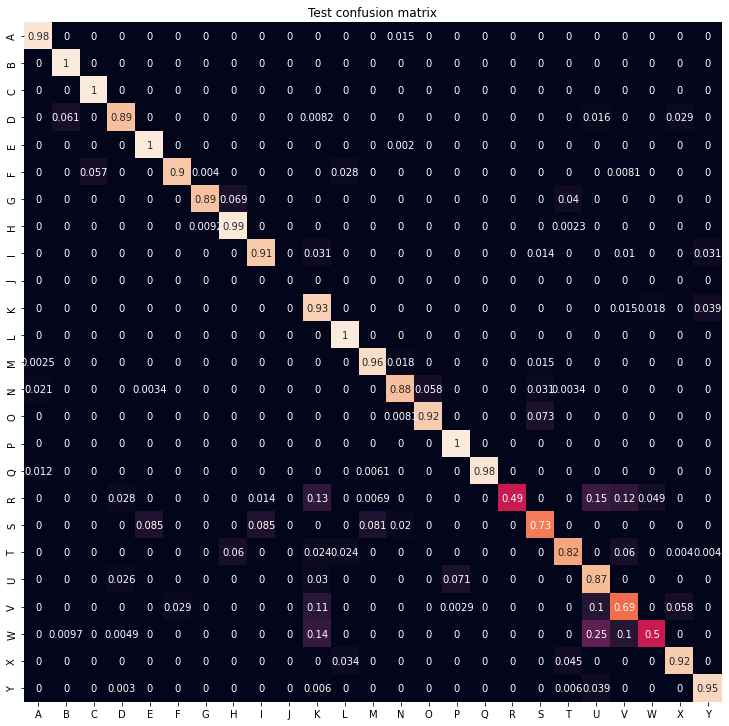

In [ ]:
# Hyperparameters
num_class=25
lr=0.05
batchsize=80
normal_std=0.01

tf.reset_default_graph()

# LAYER 1 
# INPUT = 784 -> 200
image=tf.placeholder(shape=(None,784), dtype=tf.float32, name='Imgaes')

W1=tf.get_variable(shape=(784,200), name='Weight_1',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b1=tf.get_variable(shape=(200), name='Bias_1',
                  initializer=tf.zeros_initializer())

h1=tf.matmul(image,W1,name='Hidden_1')
O1=tf.nn.relu(tf.add(h1,b1, name='Output_1'), name='Relu1')

# LAYER 2
# HIDDEN = 200 -> 25
W2=tf.get_variable(shape=(200,num_class), name='Weight_2',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b2=tf.get_variable(shape=(num_class), name='Bias_2',
                  initializer=tf.zeros_initializer())
h2=tf.matmul(O1,W2,name='Hidden_2')
O2=tf.add(h2,b2, name='Output_2')


output=tf.placeholder(dtype=tf.float32, shape=(None, num_class),
                           name='OUTPUT')

tf.summary.FileWriter('./drive/MyDrive/graphs/dropout/sgd_5', tf.get_default_graph())

# SGD
loss= tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=output, logits= O2,
                                            name='LOSS'))
sgd=tf.train.GradientDescentOptimizer (
    learning_rate=lr, name='SGD'
).minimize(loss)

# Session Phase
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

# Summerizing the results
write = tf.summary.FileWriter('./drive/MyDrive/graphs/dropout/sgd_5', sess.graph)

weights1_sum=tf.summary.histogram ('histogram of weights layer 1', W1)
weights2_sum=tf.summary.histogram ('histogram of weights layer 2', W2)
loss_sum1= tf.summary.scalar('Training Loss', loss)
loss_sum2= tf.summary.scalar('Validation Loss', loss)

for epoch in range(0,5):
    print('==================================================')
    print('====== Epoch=%s =================================== ' %(epoch))
    print('==================================================')
    for i in range(math.floor(num_train/batchsize)):
        x_temp = x_train_shaffle_normalized[i*batchsize : (i+1)*batchsize]
        x_temp_normalized = (x_temp- np.mean(x_temp, axis=0)) / (1e-3 + np.sqrt(np.var(x_temp, axis=0)))
        f={image:x_temp_normalized,
          output:y_train_shaffle[i*batchsize : (i+1)*batchsize] }
        sess.run(sgd,feed_dict=f)
        print('iter {}: \t Loss={:.4f}'.format(i,sess.run(loss,feed_dict=f)))
    f_valid={image:x_valid_normalized , 
            output:y_valid_hot}
    print('--------------------------------------------------')
    print('Epoch:{} \t Validation Loss:{:.4f} '.format(epoch,sess.run(loss,feed_dict=f_valid)))
    print('--------------------------------------------------')

    # summerize Loss on traing, validation and test, Distrubition of network weights 

    # Training
    f={image:x_train_shaffle_normalized, 
          output:y_train_shaffle}
    write.add_summary(sess.run(loss_sum1, feed_dict=f),epoch)

    # Validation
    f={image:x_valid_normalized, 
          output:y_valid_hot}
    write.add_summary(sess.run(loss_sum2, feed_dict=f),epoch)

    #write.add_summary(sess.run(summaries, tf.summary.scalar('Validation Loss', sess.run(loss,feed_dict=f))),epoch)

    write.add_summary(sess.run(weights1_sum),epoch)
    write.add_summary(sess.run(weights2_sum),epoch)


# Save the trained model
saver = tf.train.Saver()
saver.save(sess, './drive/MyDrive/graphs/dropout/sgd_5/sgd_model.ckpt')

#Calculate the model accuracy and draw confusion matrix for validation and 
saved_model = saver.restore(sess, './drive/MyDrive/graphs/dropout/sgd_5/sgd_model.ckpt')

#training data
plt.figure(figsize=(12.5, 12.5))
plt.title('Training confusion matrix')

f = {image: x_train_shaffle_normalized,
     output: y_train_shaffle}

y_train_shuffle_one_output = tf.Session().run(tf.random.shuffle(y_train, seed=12345))

y_train_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
train_accuracy = np.mean(np.where(y_train_shuffle_one_output==y_train_predicted, 1, 0))
print('SGD 5 Train Accuracy = ', train_accuracy)

cm_train = tf.math.confusion_matrix(y_train_shuffle_one_output, y_train_predicted, num_class).eval().astype(np.float64)
cm_train /= cm_train.sum(axis=1)[:,np.newaxis]
cm_train = np.where(np.isnan(cm_train), 0, cm_train)
df = pd.DataFrame(cm_train, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

#validation data
plt.figure(figsize=(12.5, 12.5))
plt.title('Validation confusion matrix')

f = {image: x_valid_normalized,
     output: y_valid_hot}

y_valid_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
valid_accuracy = np.mean(np.where(y_valid==y_valid_predicted, 1, 0))
print('SGD 5 Validation Accuracy = ', valid_accuracy)

cm_valid = tf.math.confusion_matrix(y_valid, y_valid_predicted, num_class).eval().astype(np.float64)
cm_valid /= cm_valid.sum(axis=1)[:,np.newaxis]
cm_valid = np.where(np.isnan(cm_valid), 0, cm_valid)
df = pd.DataFrame(cm_valid, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)


#test data
plt.figure(figsize=(12.5, 12.5))
plt.title('Test confusion matrix')

f = {image: x_test_normalized,
     output: y_test_hot}

y_test_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
test_accuracy = np.mean(np.where(y_test==y_test_predicted, 1, 0))
print('SGD 5 Test Accuracy = ', test_accuracy)

cm_test = tf.math.confusion_matrix(y_test, y_test_predicted, num_class).eval().astype(np.float64)
cm_test /= cm_test.sum(axis=1)[:,np.newaxis]
cm_test = np.where(np.isnan(cm_test), 0, cm_test)
df = pd.DataFrame(cm_test, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

# + Dropout (5 ephoces with rate = 50%)


INFO:tensorflow:Summary name histogram of weights layer 1 is illegal; using histogram_of_weights_layer_1 instead.
INFO:tensorflow:Summary name histogram of weights layer 2 is illegal; using histogram_of_weights_layer_2 instead.
INFO:tensorflow:Summary name Training Loss is illegal; using Training_Loss instead.
INFO:tensorflow:Summary name Validation Loss is illegal; using Validation_Loss instead.


/tensorflow-1.15.2/python3.7/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


====== Epoch=0 =================================== 
iter 0: 	 Loss=3.2082
iter 1: 	 Loss=3.2117
iter 2: 	 Loss=3.2067
iter 3: 	 Loss=3.1931
iter 4: 	 Loss=3.1982
iter 5: 	 Loss=3.1785
iter 6: 	 Loss=3.1909
iter 7: 	 Loss=3.1931
iter 8: 	 Loss=3.1925
iter 9: 	 Loss=3.1814
iter 10: 	 Loss=3.1638
iter 11: 	 Loss=3.1710
iter 12: 	 Loss=3.1487
iter 13: 	 Loss=3.1614
iter 14: 	 Loss=3.1759
iter 15: 	 Loss=3.1713
iter 16: 	 Loss=3.1391
iter 17: 	 Loss=3.1205
iter 18: 	 Loss=3.1394
iter 19: 	 Loss=3.1156
iter 20: 	 Loss=3.1398
iter 21: 	 Loss=3.0977
iter 22: 	 Loss=3.0653
iter 23: 	 Loss=3.0483
iter 24: 	 Loss=3.0681
iter 25: 	 Loss=3.0776
iter 26: 	 Loss=3.0292
iter 27: 	 Loss=3.0901
iter 28: 	 Loss=3.0410
iter 29: 	 Loss=3.0442
iter 30: 	 Loss=3.0299
iter 31: 	 Loss=3.0451
iter 32: 	 Loss=3.0474
iter 33: 	 Loss=2.9736
iter 34: 	 Loss=3.0091
iter 35: 	 Loss=3.0510
iter 36: 	 Loss=2.9099
iter 37: 	 Loss=3.0335
iter 38: 	 Loss=2.9394
iter 39: 	 Loss=2.9332
iter 40: 	 Loss=2.8573
iter 41: 	 Loss

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:112: RuntimeWarning: invalid value encountered in true_divide


SGD 5 Validation Accuracy =  0.7298930729893073


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:129: RuntimeWarning: invalid value encountered in true_divide


SGD 5 Test Accuracy =  0.7399609592861126


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:147: RuntimeWarning: invalid value encountered in true_divide


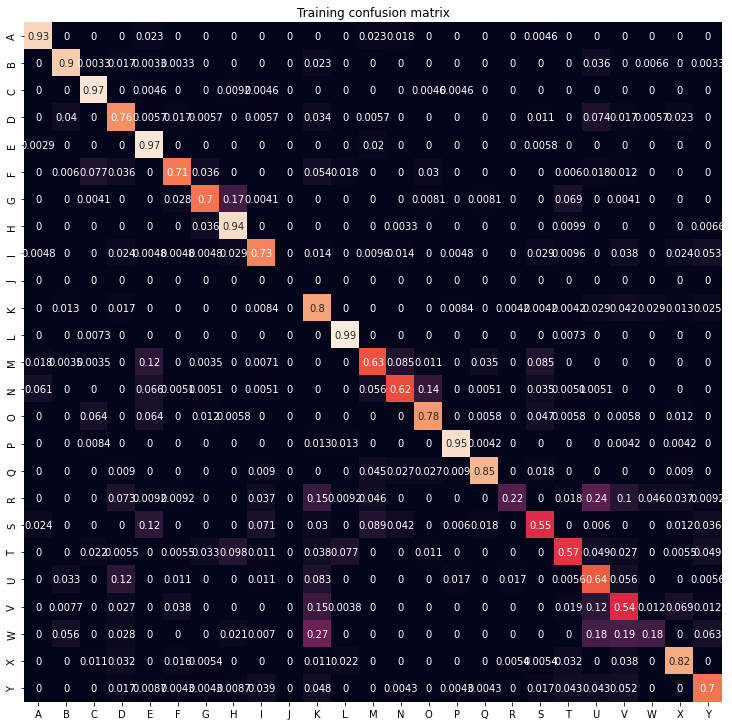

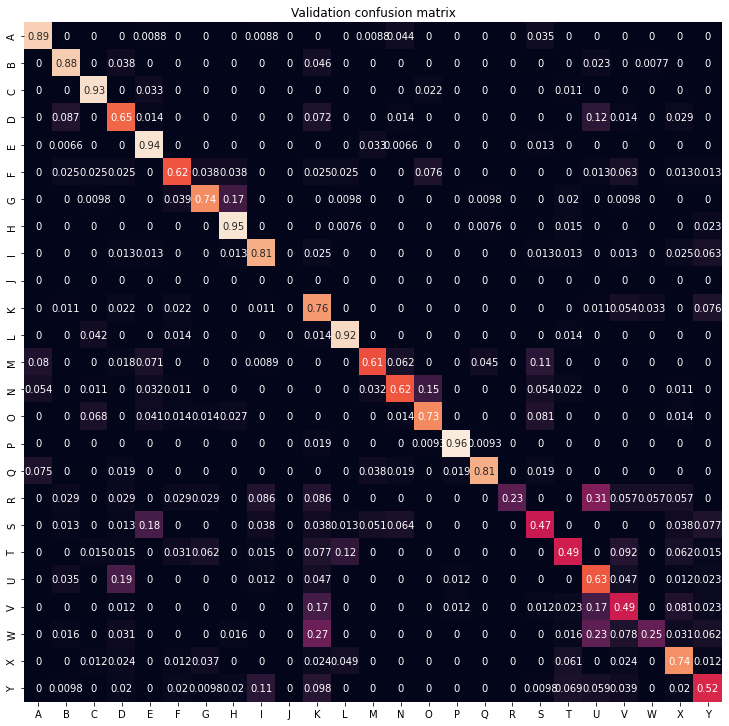

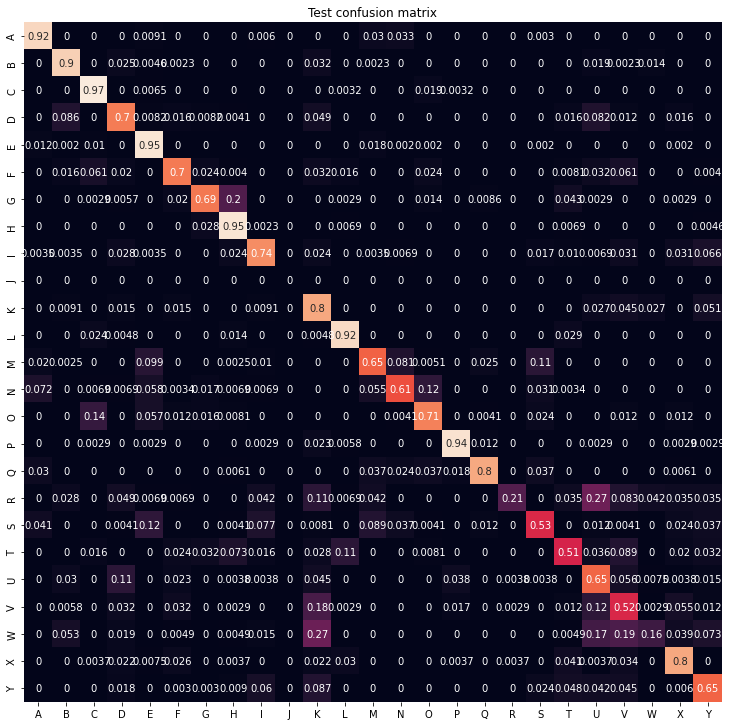

In [ ]:
# Hyperparameters
num_class=25
lr=0.05
batchsize=80
normal_std=0.01
dropout_rate = 0.5

tf.reset_default_graph()

# LAYER 1 
# INPUT = 784 -> 200
image=tf.placeholder(shape=(None,784), dtype=tf.float32, name='Imgaes')

W1=tf.get_variable(shape=(784,200), name='Weight_1',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b1=tf.get_variable(shape=(200), name='Bias_1',
                  initializer=tf.zeros_initializer())

h1=tf.matmul(tf.nn.dropout(image, rate=dropout_rate),W1,name='Hidden_1')
O1=tf.nn.relu(tf.add(h1,b1, name='Output_1'), name='Relu1')

# LAYER 2
# HIDDEN = 200 -> 25
W2=tf.get_variable(shape=(200,num_class), name='Weight_2',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b2=tf.get_variable(shape=(num_class), name='Bias_2',
                  initializer=tf.zeros_initializer())
h2=tf.matmul(tf.nn.dropout(O1, rate=dropout_rate),W2,name='Hidden_2')
O2=tf.add(h2,b2, name='Output_2')


output=tf.placeholder(dtype=tf.float32, shape=(None, num_class),
                           name='OUTPUT')

tf.summary.FileWriter('./drive/MyDrive/graphs/dropout/sgd_5_dropout', tf.get_default_graph())

# SGD
loss= tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=output, logits= O2,
                                            name='LOSS'))
sgd=tf.train.GradientDescentOptimizer (
    learning_rate=lr, name='SGD'
).minimize(loss)

# Session Phase
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

# Summerizing the results
write = tf.summary.FileWriter('./drive/MyDrive/graphs/dropout/sgd_5_dropout', sess.graph)

weights1_sum=tf.summary.histogram ('histogram of weights layer 1', W1)
weights2_sum=tf.summary.histogram ('histogram of weights layer 2', W2)
loss_sum1= tf.summary.scalar('Training Loss', loss)
loss_sum2= tf.summary.scalar('Validation Loss', loss)

for epoch in range(0,5):
    print('==================================================')
    print('====== Epoch=%s =================================== ' %(epoch))
    print('==================================================')
    for i in range(math.floor(num_train/batchsize)):
        x_temp = x_train_shaffle_normalized[i*batchsize : (i+1)*batchsize]
        x_temp_normalized = (x_temp- np.mean(x_temp, axis=0)) / (1e-3 + np.sqrt(np.var(x_temp, axis=0)))
        f={image:x_temp_normalized,
          output:y_train_shaffle[i*batchsize : (i+1)*batchsize] }
        sess.run(sgd,feed_dict=f)
        print('iter {}: \t Loss={:.4f}'.format(i,sess.run(loss,feed_dict=f)))
    f_valid={image:x_valid_normalized , 
            output:y_valid_hot}
    print('--------------------------------------------------')
    print('Epoch:{} \t Validation Loss:{:.4f} '.format(epoch,sess.run(loss,feed_dict=f_valid)))
    print('--------------------------------------------------')

    # summerize Loss on traing, validation and test, Distrubition of network weights 

    # Training
    f={image:x_train_shaffle_normalized, 
          output:y_train_shaffle}
    write.add_summary(sess.run(loss_sum1, feed_dict=f),epoch)

    # Validation
    f={image:x_valid_normalized, 
          output:y_valid_hot}
    write.add_summary(sess.run(loss_sum2, feed_dict=f),epoch)

    #write.add_summary(sess.run(summaries, tf.summary.scalar('Validation Loss', sess.run(loss,feed_dict=f))),epoch)

    write.add_summary(sess.run(weights1_sum),epoch)
    write.add_summary(sess.run(weights2_sum),epoch)


# Save the trained model
saver = tf.train.Saver()
saver.save(sess, './drive/MyDrive/graphs/dropout/sgd_5_dropout/sgd_model.ckpt')

#Calculate the model accuracy and draw confusion matrix for validation and 
saved_model = saver.restore(sess, './drive/MyDrive/graphs/dropout/sgd_5_dropout/sgd_model.ckpt')

#training data
plt.figure(figsize=(12.5, 12.5))
plt.title('Training confusion matrix')

f = {image: x_train_shaffle_normalized,
     output: y_train_shaffle}

y_train_shuffle_one_output = tf.Session().run(tf.random.shuffle(y_train, seed=12345))

y_train_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
train_accuracy = np.mean(np.where(y_train_shuffle_one_output==y_train_predicted, 1, 0))
print('SGD 5 Train Accuracy = ', train_accuracy)

cm_train = tf.math.confusion_matrix(y_train_shuffle_one_output, y_train_predicted, num_class).eval().astype(np.float64)
cm_train /= cm_train.sum(axis=1)[:,np.newaxis]
cm_train = np.where(np.isnan(cm_train), 0, cm_train)
df = pd.DataFrame(cm_train, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

#validation data
plt.figure(figsize=(12.5, 12.5))
plt.title('Validation confusion matrix')

f = {image: x_valid_normalized,
     output: y_valid_hot}

y_valid_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
valid_accuracy = np.mean(np.where(y_valid==y_valid_predicted, 1, 0))
print('SGD 5 Validation Accuracy = ', valid_accuracy)

cm_valid = tf.math.confusion_matrix(y_valid, y_valid_predicted, num_class).eval().astype(np.float64)
cm_valid /= cm_valid.sum(axis=1)[:,np.newaxis]
cm_valid = np.where(np.isnan(cm_valid), 0, cm_valid)
df = pd.DataFrame(cm_valid, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)


#test data
plt.figure(figsize=(12.5, 12.5))
plt.title('Test confusion matrix')

f = {image: x_test_normalized,
     output: y_test_hot}

y_test_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
test_accuracy = np.mean(np.where(y_test==y_test_predicted, 1, 0))
print('SGD 5 Test Accuracy = ', test_accuracy)

cm_test = tf.math.confusion_matrix(y_test, y_test_predicted, num_class).eval().astype(np.float64)
cm_test /= cm_test.sum(axis=1)[:,np.newaxis]
cm_test = np.where(np.isnan(cm_test), 0, cm_test)
df = pd.DataFrame(cm_test, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

# + Dropout (10 ephoces with dropout rate = 50%)


INFO:tensorflow:Summary name histogram of weights layer 1 is illegal; using histogram_of_weights_layer_1 instead.
INFO:tensorflow:Summary name histogram of weights layer 2 is illegal; using histogram_of_weights_layer_2 instead.
INFO:tensorflow:Summary name Training Loss is illegal; using Training_Loss instead.
INFO:tensorflow:Summary name Validation Loss is illegal; using Validation_Loss instead.


/tensorflow-1.15.2/python3.7/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


====== Epoch=0 =================================== 
iter 0: 	 Loss=3.2006
iter 1: 	 Loss=3.2126
iter 2: 	 Loss=3.2011
iter 3: 	 Loss=3.1969
iter 4: 	 Loss=3.1901
iter 5: 	 Loss=3.1905
iter 6: 	 Loss=3.1888
iter 7: 	 Loss=3.1919
iter 8: 	 Loss=3.1882
iter 9: 	 Loss=3.1820
iter 10: 	 Loss=3.1763
iter 11: 	 Loss=3.1602
iter 12: 	 Loss=3.1556
iter 13: 	 Loss=3.1627
iter 14: 	 Loss=3.1661
iter 15: 	 Loss=3.1582
iter 16: 	 Loss=3.1466
iter 17: 	 Loss=3.1413
iter 18: 	 Loss=3.1210
iter 19: 	 Loss=3.1168
iter 20: 	 Loss=3.1229
iter 21: 	 Loss=3.0961
iter 22: 	 Loss=3.0601
iter 23: 	 Loss=3.0494
iter 24: 	 Loss=3.0715
iter 25: 	 Loss=3.0627
iter 26: 	 Loss=3.0265
iter 27: 	 Loss=3.0474
iter 28: 	 Loss=3.0300
iter 29: 	 Loss=3.0140
iter 30: 	 Loss=3.0023
iter 31: 	 Loss=3.0262
iter 32: 	 Loss=3.0244
iter 33: 	 Loss=2.9314
iter 34: 	 Loss=2.9856
iter 35: 	 Loss=3.0298
iter 36: 	 Loss=2.8955
iter 37: 	 Loss=3.0220
iter 38: 	 Loss=2.9458
iter 39: 	 Loss=2.9405
iter 40: 	 Loss=2.8545
iter 41: 	 Loss

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:112: RuntimeWarning: invalid value encountered in true_divide


SGD 5 Validation Accuracy =  0.8926080892608089


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:129: RuntimeWarning: invalid value encountered in true_divide


SGD 5 Test Accuracy =  0.8986335750139431


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:147: RuntimeWarning: invalid value encountered in true_divide


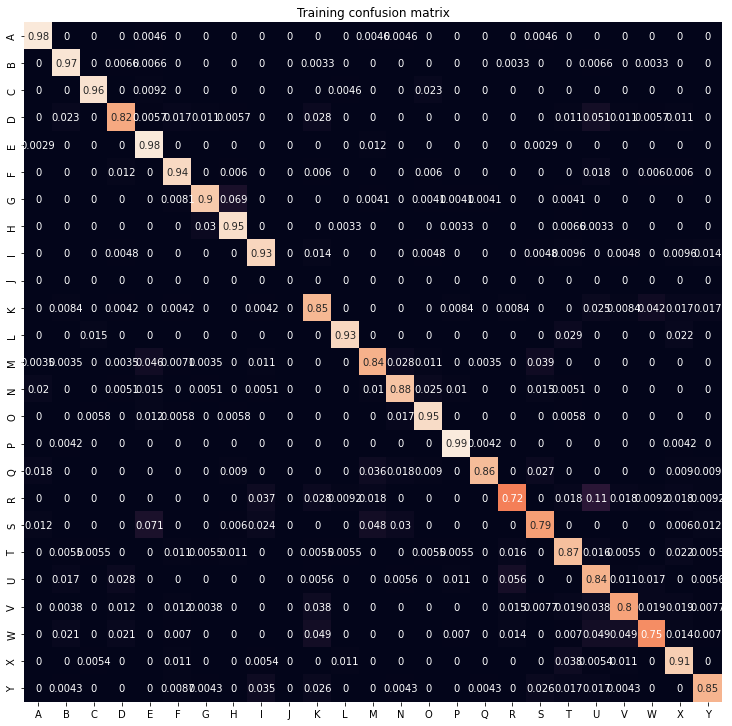

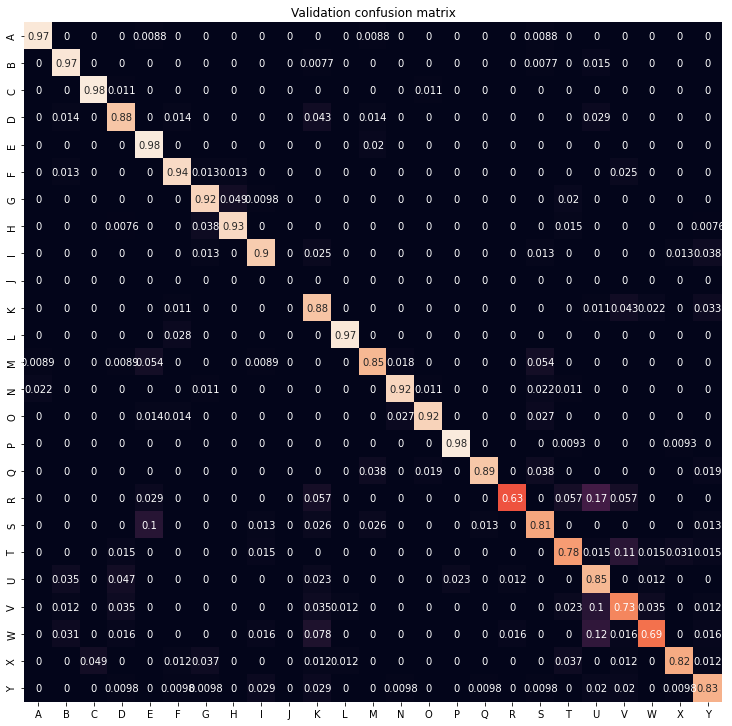

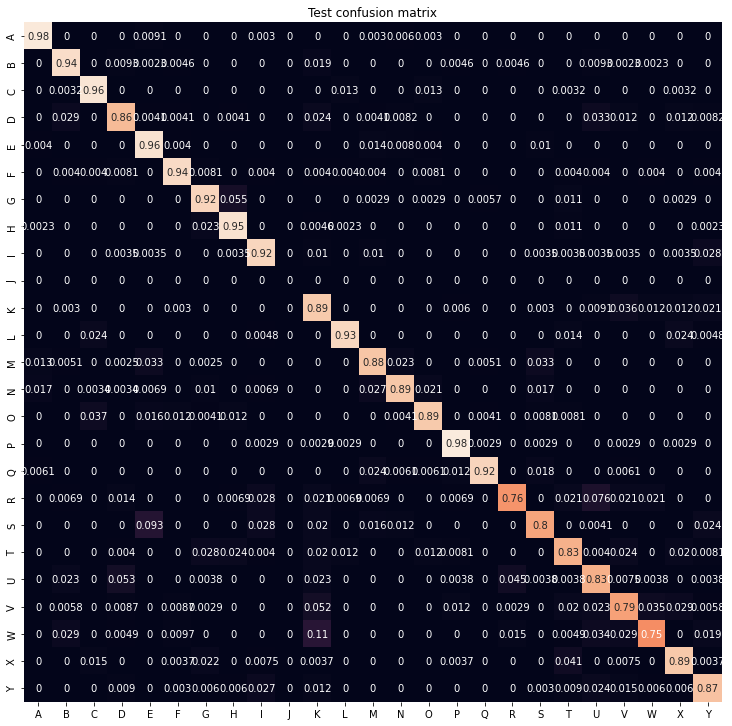

In [ ]:
# Hyperparameters
num_class=25
lr=0.05
batchsize=80
normal_std=0.01
dropout_rate = 0.5

tf.reset_default_graph()

# LAYER 1 
# INPUT = 784 -> 200
image=tf.placeholder(shape=(None,784), dtype=tf.float32, name='Imgaes')

W1=tf.get_variable(shape=(784,200), name='Weight_1',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b1=tf.get_variable(shape=(200), name='Bias_1',
                  initializer=tf.zeros_initializer())

h1=tf.matmul(tf.nn.dropout(image, rate=dropout_rate),W1,name='Hidden_1')
O1=tf.nn.relu(tf.add(h1,b1, name='Output_1'), name='Relu1')

# LAYER 2
# HIDDEN = 200 -> 25
W2=tf.get_variable(shape=(200,num_class), name='Weight_2',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b2=tf.get_variable(shape=(num_class), name='Bias_2',
                  initializer=tf.zeros_initializer())
h2=tf.matmul(tf.nn.dropout(O1, rate=dropout_rate),W2,name='Hidden_2')
O2=tf.add(h2,b2, name='Output_2')


output=tf.placeholder(dtype=tf.float32, shape=(None, num_class),
                           name='OUTPUT')

tf.summary.FileWriter('./drive/MyDrive/graphs/dropout/sgd_10_dropout', tf.get_default_graph())

# SGD
loss= tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=output, logits= O2,
                                            name='LOSS'))
sgd=tf.train.GradientDescentOptimizer (
    learning_rate=lr, name='SGD'
).minimize(loss)

# Session Phase
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

# Summerizing the results
write = tf.summary.FileWriter('./drive/MyDrive/graphs/dropout/sgd_10_dropout', sess.graph)

weights1_sum=tf.summary.histogram ('histogram of weights layer 1', W1)
weights2_sum=tf.summary.histogram ('histogram of weights layer 2', W2)
loss_sum1= tf.summary.scalar('Training Loss', loss)
loss_sum2= tf.summary.scalar('Validation Loss', loss)

for epoch in range(0,10):
    print('==================================================')
    print('====== Epoch=%s =================================== ' %(epoch))
    print('==================================================')
    for i in range(math.floor(num_train/batchsize)):
        x_temp = x_train_shaffle_normalized[i*batchsize : (i+1)*batchsize]
        x_temp_normalized = (x_temp- np.mean(x_temp, axis=0)) / (1e-3 + np.sqrt(np.var(x_temp, axis=0)))
        f={image:x_temp_normalized,
          output:y_train_shaffle[i*batchsize : (i+1)*batchsize] }
        sess.run(sgd,feed_dict=f)
        print('iter {}: \t Loss={:.4f}'.format(i,sess.run(loss,feed_dict=f)))
    f_valid={image:x_valid_normalized , 
            output:y_valid_hot}
    print('--------------------------------------------------')
    print('Epoch:{} \t Validation Loss:{:.4f} '.format(epoch,sess.run(loss,feed_dict=f_valid)))
    print('--------------------------------------------------')

    # summerize Loss on traing, validation and test, Distrubition of network weights 

    # Training
    f={image:x_train_shaffle_normalized, 
          output:y_train_shaffle}
    write.add_summary(sess.run(loss_sum1, feed_dict=f),epoch)

    # Validation
    f={image:x_valid_normalized, 
          output:y_valid_hot}
    write.add_summary(sess.run(loss_sum2, feed_dict=f),epoch)

    #write.add_summary(sess.run(summaries, tf.summary.scalar('Validation Loss', sess.run(loss,feed_dict=f))),epoch)

    write.add_summary(sess.run(weights1_sum),epoch)
    write.add_summary(sess.run(weights2_sum),epoch)


# Save the trained model
saver = tf.train.Saver()
saver.save(sess, './drive/MyDrive/graphs/dropout/sgd_10_dropout/sgd_model.ckpt')

#Calculate the model accuracy and draw confusion matrix for validation and 
saved_model = saver.restore(sess, './drive/MyDrive/graphs/dropout/sgd_10_dropout/sgd_model.ckpt')

#training data
plt.figure(figsize=(12.5, 12.5))
plt.title('Training confusion matrix')

f = {image: x_train_shaffle_normalized,
     output: y_train_shaffle}

y_train_shuffle_one_output = tf.Session().run(tf.random.shuffle(y_train, seed=12345))

y_train_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
train_accuracy = np.mean(np.where(y_train_shuffle_one_output==y_train_predicted, 1, 0))
print('SGD 5 Train Accuracy = ', train_accuracy)

cm_train = tf.math.confusion_matrix(y_train_shuffle_one_output, y_train_predicted, num_class).eval().astype(np.float64)
cm_train /= cm_train.sum(axis=1)[:,np.newaxis]
cm_train = np.where(np.isnan(cm_train), 0, cm_train)
df = pd.DataFrame(cm_train, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

#validation data
plt.figure(figsize=(12.5, 12.5))
plt.title('Validation confusion matrix')

f = {image: x_valid_normalized,
     output: y_valid_hot}

y_valid_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
valid_accuracy = np.mean(np.where(y_valid==y_valid_predicted, 1, 0))
print('SGD 5 Validation Accuracy = ', valid_accuracy)

cm_valid = tf.math.confusion_matrix(y_valid, y_valid_predicted, num_class).eval().astype(np.float64)
cm_valid /= cm_valid.sum(axis=1)[:,np.newaxis]
cm_valid = np.where(np.isnan(cm_valid), 0, cm_valid)
df = pd.DataFrame(cm_valid, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)


#test data
plt.figure(figsize=(12.5, 12.5))
plt.title('Test confusion matrix')

f = {image: x_test_normalized,
     output: y_test_hot}

y_test_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
test_accuracy = np.mean(np.where(y_test==y_test_predicted, 1, 0))
print('SGD 5 Test Accuracy = ', test_accuracy)

cm_test = tf.math.confusion_matrix(y_test, y_test_predicted, num_class).eval().astype(np.float64)
cm_test /= cm_test.sum(axis=1)[:,np.newaxis]
cm_test = np.where(np.isnan(cm_test), 0, cm_test)
df = pd.DataFrame(cm_test, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

# + Dropout (6 ephoces with dropout rate = 17%)


INFO:tensorflow:Summary name histogram of weights layer 1 is illegal; using histogram_of_weights_layer_1 instead.
INFO:tensorflow:Summary name histogram of weights layer 2 is illegal; using histogram_of_weights_layer_2 instead.
INFO:tensorflow:Summary name Training Loss is illegal; using Training_Loss instead.
INFO:tensorflow:Summary name Validation Loss is illegal; using Validation_Loss instead.


/tensorflow-1.15.2/python3.7/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


====== Epoch=0 =================================== 
iter 0: 	 Loss=3.2048
iter 1: 	 Loss=3.1967
iter 2: 	 Loss=3.2037
iter 3: 	 Loss=3.1926
iter 4: 	 Loss=3.1956
iter 5: 	 Loss=3.1842
iter 6: 	 Loss=3.1828
iter 7: 	 Loss=3.1846
iter 8: 	 Loss=3.1811
iter 9: 	 Loss=3.1687
iter 10: 	 Loss=3.1637
iter 11: 	 Loss=3.1636
iter 12: 	 Loss=3.1352
iter 13: 	 Loss=3.1475
iter 14: 	 Loss=3.1618
iter 15: 	 Loss=3.1504
iter 16: 	 Loss=3.1149
iter 17: 	 Loss=3.1169
iter 18: 	 Loss=3.1362
iter 19: 	 Loss=3.1065
iter 20: 	 Loss=3.1047
iter 21: 	 Loss=3.0745
iter 22: 	 Loss=3.0407
iter 23: 	 Loss=3.0099
iter 24: 	 Loss=3.0454
iter 25: 	 Loss=3.0305
iter 26: 	 Loss=3.0047
iter 27: 	 Loss=3.0416
iter 28: 	 Loss=3.0070
iter 29: 	 Loss=2.9646
iter 30: 	 Loss=2.9524
iter 31: 	 Loss=2.9914
iter 32: 	 Loss=3.0084
iter 33: 	 Loss=2.9189
iter 34: 	 Loss=2.9615
iter 35: 	 Loss=3.0126
iter 36: 	 Loss=2.8524
iter 37: 	 Loss=2.9710
iter 38: 	 Loss=2.8716
iter 39: 	 Loss=2.8940
iter 40: 	 Loss=2.8020
iter 41: 	 Loss

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:112: RuntimeWarning: invalid value encountered in true_divide


SGD 5 Validation Accuracy =  0.9200371920037193


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:129: RuntimeWarning: invalid value encountered in true_divide


SGD 5 Test Accuracy =  0.9217791411042945


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:147: RuntimeWarning: invalid value encountered in true_divide


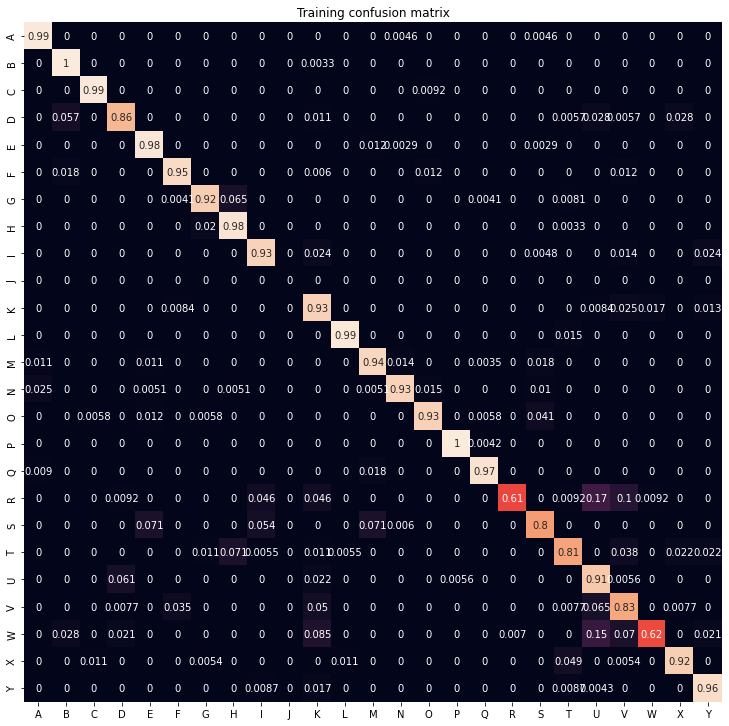

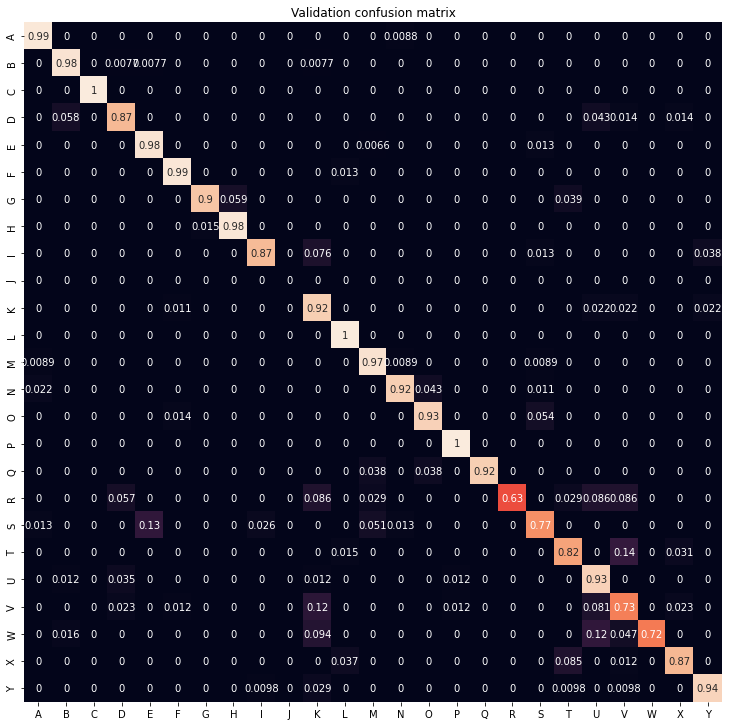

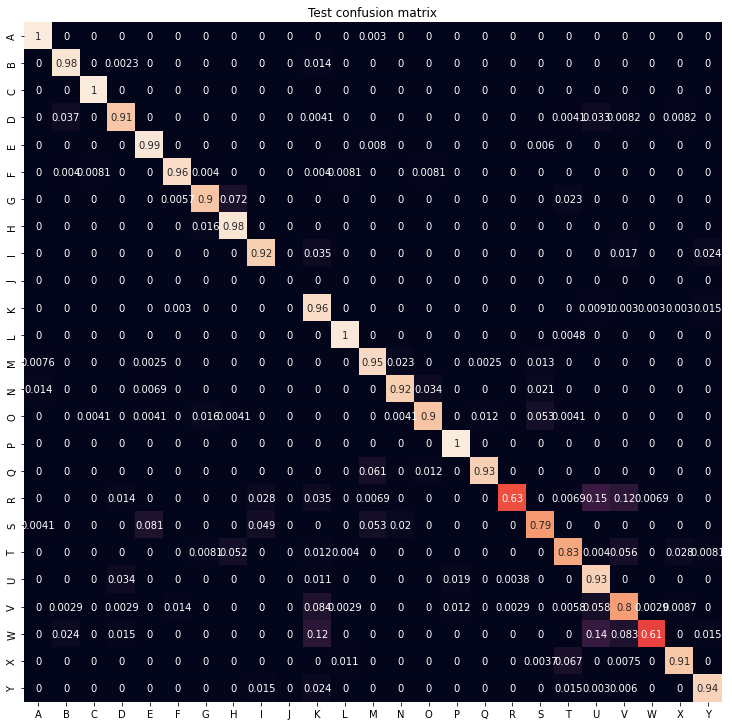

In [ ]:
# Hyperparameters
num_class=25
lr=0.05
batchsize=80
normal_std=0.01
dropout_rate = 0.17

tf.reset_default_graph()

# LAYER 1 
# INPUT = 784 -> 200
image=tf.placeholder(shape=(None,784), dtype=tf.float32, name='Imgaes')

W1=tf.get_variable(shape=(784,200), name='Weight_1',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b1=tf.get_variable(shape=(200), name='Bias_1',
                  initializer=tf.zeros_initializer())

h1=tf.matmul(tf.nn.dropout(image, rate=dropout_rate),W1,name='Hidden_1')
O1=tf.nn.relu(tf.add(h1,b1, name='Output_1'), name='Relu1')

# LAYER 2
# HIDDEN = 200 -> 25
W2=tf.get_variable(shape=(200,num_class), name='Weight_2',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b2=tf.get_variable(shape=(num_class), name='Bias_2',
                  initializer=tf.zeros_initializer())
h2=tf.matmul(tf.nn.dropout(O1, rate=dropout_rate),W2,name='Hidden_2')
O2=tf.add(h2,b2, name='Output_2')


output=tf.placeholder(dtype=tf.float32, shape=(None, num_class),
                           name='OUTPUT')

tf.summary.FileWriter('./drive/MyDrive/graphs/dropout/sgd_6_dropout', tf.get_default_graph())

# SGD
loss= tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=output, logits= O2,
                                            name='LOSS'))
sgd=tf.train.GradientDescentOptimizer (
    learning_rate=lr, name='SGD'
).minimize(loss)

# Session Phase
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

# Summerizing the results
write = tf.summary.FileWriter('./drive/MyDrive/graphs/dropout/sgd_6_dropout', sess.graph)

weights1_sum=tf.summary.histogram ('histogram of weights layer 1', W1)
weights2_sum=tf.summary.histogram ('histogram of weights layer 2', W2)
loss_sum1= tf.summary.scalar('Training Loss', loss)
loss_sum2= tf.summary.scalar('Validation Loss', loss)

for epoch in range(0,6):
    print('==================================================')
    print('====== Epoch=%s =================================== ' %(epoch))
    print('==================================================')
    for i in range(math.floor(num_train/batchsize)):
        x_temp = x_train_shaffle_normalized[i*batchsize : (i+1)*batchsize]
        x_temp_normalized = (x_temp- np.mean(x_temp, axis=0)) / (1e-3 + np.sqrt(np.var(x_temp, axis=0)))
        f={image:x_temp_normalized,
          output:y_train_shaffle[i*batchsize : (i+1)*batchsize] }
        sess.run(sgd,feed_dict=f)
        print('iter {}: \t Loss={:.4f}'.format(i,sess.run(loss,feed_dict=f)))
    f_valid={image:x_valid_normalized , 
            output:y_valid_hot}
    print('--------------------------------------------------')
    print('Epoch:{} \t Validation Loss:{:.4f} '.format(epoch,sess.run(loss,feed_dict=f_valid)))
    print('--------------------------------------------------')

    # summerize Loss on traing, validation and test, Distrubition of network weights 

    # Training
    f={image:x_train_shaffle_normalized, 
          output:y_train_shaffle}
    write.add_summary(sess.run(loss_sum1, feed_dict=f),epoch)

    # Validation
    f={image:x_valid_normalized, 
          output:y_valid_hot}
    write.add_summary(sess.run(loss_sum2, feed_dict=f),epoch)

    #write.add_summary(sess.run(summaries, tf.summary.scalar('Validation Loss', sess.run(loss,feed_dict=f))),epoch)

    write.add_summary(sess.run(weights1_sum),epoch)
    write.add_summary(sess.run(weights2_sum),epoch)


# Save the trained model
saver = tf.train.Saver()
saver.save(sess, './drive/MyDrive/graphs/dropout/sgd_6_dropout/sgd_model.ckpt')

#Calculate the model accuracy and draw confusion matrix for validation and 
saved_model = saver.restore(sess, './drive/MyDrive/graphs/dropout/sgd_6_dropout/sgd_model.ckpt')

#training data
plt.figure(figsize=(12.5, 12.5))
plt.title('Training confusion matrix')

f = {image: x_train_shaffle_normalized,
     output: y_train_shaffle}

y_train_shuffle_one_output = tf.Session().run(tf.random.shuffle(y_train, seed=12345))

y_train_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
train_accuracy = np.mean(np.where(y_train_shuffle_one_output==y_train_predicted, 1, 0))
print('SGD 5 Train Accuracy = ', train_accuracy)

cm_train = tf.math.confusion_matrix(y_train_shuffle_one_output, y_train_predicted, num_class).eval().astype(np.float64)
cm_train /= cm_train.sum(axis=1)[:,np.newaxis]
cm_train = np.where(np.isnan(cm_train), 0, cm_train)
df = pd.DataFrame(cm_train, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

#validation data
plt.figure(figsize=(12.5, 12.5))
plt.title('Validation confusion matrix')

f = {image: x_valid_normalized,
     output: y_valid_hot}

y_valid_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
valid_accuracy = np.mean(np.where(y_valid==y_valid_predicted, 1, 0))
print('SGD 5 Validation Accuracy = ', valid_accuracy)

cm_valid = tf.math.confusion_matrix(y_valid, y_valid_predicted, num_class).eval().astype(np.float64)
cm_valid /= cm_valid.sum(axis=1)[:,np.newaxis]
cm_valid = np.where(np.isnan(cm_valid), 0, cm_valid)
df = pd.DataFrame(cm_valid, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)


#test data
plt.figure(figsize=(12.5, 12.5))
plt.title('Test confusion matrix')

f = {image: x_test_normalized,
     output: y_test_hot}

y_test_predicted = np.argmax(sess.run(O2, feed_dict=f), axis=1)
test_accuracy = np.mean(np.where(y_test==y_test_predicted, 1, 0))
print('SGD 5 Test Accuracy = ', test_accuracy)

cm_test = tf.math.confusion_matrix(y_test, y_test_predicted, num_class).eval().astype(np.float64)
cm_test /= cm_test.sum(axis=1)[:,np.newaxis]
cm_test = np.where(np.isnan(cm_test), 0, cm_test)
df = pd.DataFrame(cm_test, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

# Part E (Increase layers numbers and batch normalization effect)


*   5 Layer network
*   dropout rate = 17%
*   6 ephoces
*   Batch Normalization



INFO:tensorflow:Summary name histogram of weights layer 1 is illegal; using histogram_of_weights_layer_1 instead.
INFO:tensorflow:Summary name histogram of weights layer 2 is illegal; using histogram_of_weights_layer_2 instead.
INFO:tensorflow:Summary name Training Loss is illegal; using Training_Loss instead.
INFO:tensorflow:Summary name Validation Loss is illegal; using Validation_Loss instead.


/tensorflow-1.15.2/python3.7/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


====== Epoch=0 =================================== 
iter 0: 	 Loss=3.2065
iter 1: 	 Loss=3.2041
iter 2: 	 Loss=3.2004
iter 3: 	 Loss=3.1986
iter 4: 	 Loss=3.1956
iter 5: 	 Loss=3.1842
iter 6: 	 Loss=3.1828
iter 7: 	 Loss=3.1822
iter 8: 	 Loss=3.1815
iter 9: 	 Loss=3.1719
iter 10: 	 Loss=3.1679
iter 11: 	 Loss=3.1631
iter 12: 	 Loss=3.1378
iter 13: 	 Loss=3.1546
iter 14: 	 Loss=3.1620
iter 15: 	 Loss=3.1517
iter 16: 	 Loss=3.1177
iter 17: 	 Loss=3.1240
iter 18: 	 Loss=3.1242
iter 19: 	 Loss=3.0995
iter 20: 	 Loss=3.1149
iter 21: 	 Loss=3.0768
iter 22: 	 Loss=3.0288
iter 23: 	 Loss=3.0077
iter 24: 	 Loss=3.0421
iter 25: 	 Loss=3.0270
iter 26: 	 Loss=3.0150
iter 27: 	 Loss=3.0508
iter 28: 	 Loss=3.0207
iter 29: 	 Loss=2.9934
iter 30: 	 Loss=2.9818
iter 31: 	 Loss=2.9996
iter 32: 	 Loss=3.0099
iter 33: 	 Loss=2.9201
iter 34: 	 Loss=2.9766
iter 35: 	 Loss=3.0242
iter 36: 	 Loss=2.8588
iter 37: 	 Loss=2.9902
iter 38: 	 Loss=2.8956
iter 39: 	 Loss=2.9113
iter 40: 	 Loss=2.8139
iter 41: 	 Loss

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:139: RuntimeWarning: invalid value encountered in true_divide


SGD 5 Validation Accuracy =  0.9442119944211994


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:156: RuntimeWarning: invalid value encountered in true_divide


SGD 5 Test Accuracy =  0.952175125488009


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:174: RuntimeWarning: invalid value encountered in true_divide


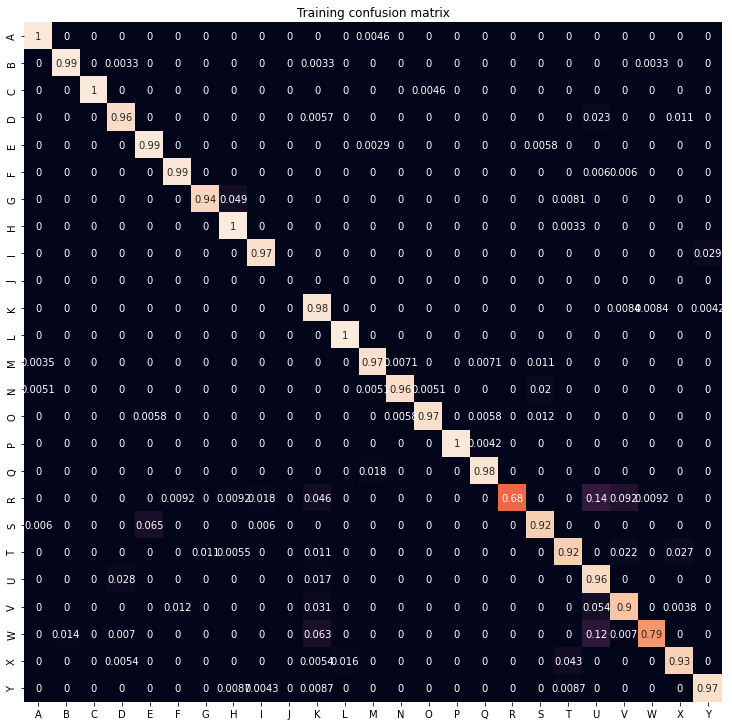

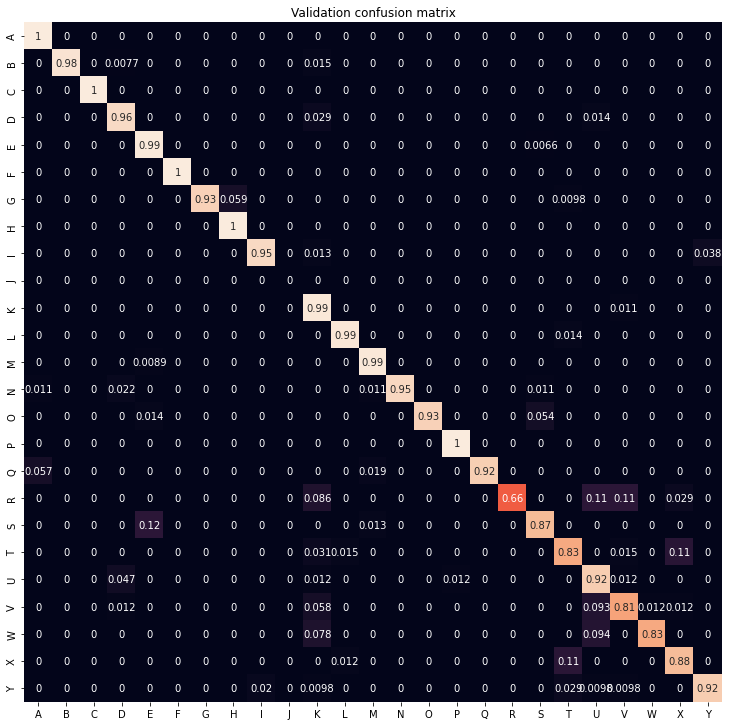

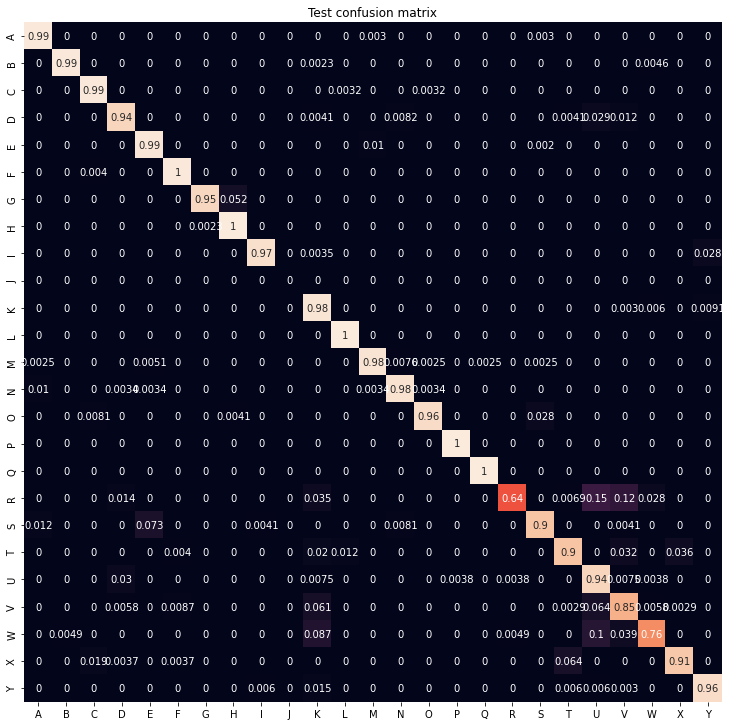

In [ ]:
# Hyperparameters
num_class=25
lr=0.05
batchsize=80
normal_std=0.01
dropout_rate = 0.17

tf.reset_default_graph()

# LAYER 1 
# INPUT = 784 -> 200
image=tf.placeholder(shape=(None,784), dtype=tf.float32, name='Imgaes')

W1=tf.get_variable(shape=(784,200), name='Weight_1',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b1=tf.get_variable(shape=(200), name='Bias_1',
                  initializer=tf.zeros_initializer())

h1=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(image, rate=dropout_rate),W1,name='Hidden_1'))
O1=tf.nn.relu(tf.add(h1,b1, name='Output_1'), name='Relu1')

# LAYER 2
# HIDDEN = 200 -> 200
W2=tf.get_variable(shape=(200,200), name='Weight_2',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b2=tf.get_variable(shape=(200), name='Bias_2',
                  initializer=tf.zeros_initializer())
h2=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(O1, rate=dropout_rate),W2,name='Hidden_2'))
O2=tf.nn.relu(tf.add(h2,b2, name='Output_2'), name='Relu2')

# LAYER 3
# HIDDEN = 200 -> 200
W3=tf.get_variable(shape=(200,200), name='Weight_3',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b3=tf.get_variable(shape=(200), name='Bias_3',
                  initializer=tf.zeros_initializer())
h3=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(O2, rate=dropout_rate),W3,name='Hidden_3'))
O3=tf.nn.relu(tf.add(h3,b3, name='Output_3'), name='Relu3')

# LAYER 4
# HIDDEN = 200 -> 200
W4=tf.get_variable(shape=(200,200), name='Weight_4',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b4=tf.get_variable(shape=(200), name='Bias_4',
                  initializer=tf.zeros_initializer())
h4=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(O3, rate=dropout_rate),W4,name='Hidden_4'))
O4=tf.nn.relu(tf.add(h4,b4, name='Output_4'), name='Relu4')

# LAYER 5
# HIDDEN = 200 -> 25
W5=tf.get_variable(shape=(200,num_class), name='Weight_5',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b5=tf.get_variable(shape=(num_class), name='Bias_5',
                  initializer=tf.zeros_initializer())
h5=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(O1, rate=dropout_rate),W5,name='Hidden_5'))
O5=tf.add(h5,b5, name='Output_5')


output=tf.placeholder(dtype=tf.float32, shape=(None, num_class),
                           name='OUTPUT')

tf.summary.FileWriter('./drive/MyDrive/graphs/bach_normalization/sgd_6_dropout_5layer', tf.get_default_graph())

# SGD
loss= tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=output, logits= O5,
                                            name='LOSS'))
sgd=tf.train.GradientDescentOptimizer (
    learning_rate=lr, name='SGD'
).minimize(loss)

# Session Phase
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

# Summerizing the results
write = tf.summary.FileWriter('./drive/MyDrive/graphs/bach_normalization/sgd_6_dropout_5layer', sess.graph)

weights1_sum=tf.summary.histogram ('histogram of weights layer 1', W1)
weights2_sum=tf.summary.histogram ('histogram of weights layer 2', W2)
loss_sum1= tf.summary.scalar('Training Loss', loss)
loss_sum2= tf.summary.scalar('Validation Loss', loss)

for epoch in range(0,6):
    print('==================================================')
    print('====== Epoch=%s =================================== ' %(epoch))
    print('==================================================')
    for i in range(math.floor(num_train/batchsize)):
        x_temp = x_train_shaffle_normalized[i*batchsize : (i+1)*batchsize]
        x_temp_normalized = (x_temp- np.mean(x_temp, axis=0)) / (1e-3 + np.sqrt(np.var(x_temp, axis=0)))
        f={image:x_temp_normalized,
          output:y_train_shaffle[i*batchsize : (i+1)*batchsize] }
        sess.run(sgd,feed_dict=f)
        print('iter {}: \t Loss={:.4f}'.format(i,sess.run(loss,feed_dict=f)))
    f_valid={image:x_valid_normalized , 
            output:y_valid_hot}
    print('--------------------------------------------------')
    print('Epoch:{} \t Validation Loss:{:.4f} '.format(epoch,sess.run(loss,feed_dict=f_valid)))
    print('--------------------------------------------------')

    # summerize Loss on traing, validation and test, Distrubition of network weights 

    # Training
    f={image:x_train_shaffle_normalized, 
          output:y_train_shaffle}
    write.add_summary(sess.run(loss_sum1, feed_dict=f),epoch)

    # Validation
    f={image:x_valid_normalized, 
          output:y_valid_hot}
    write.add_summary(sess.run(loss_sum2, feed_dict=f),epoch)

    #write.add_summary(sess.run(summaries, tf.summary.scalar('Validation Loss', sess.run(loss,feed_dict=f))),epoch)

    write.add_summary(sess.run(weights1_sum),epoch)
    write.add_summary(sess.run(weights2_sum),epoch)


# Save the trained model
saver = tf.train.Saver()
saver.save(sess, './drive/MyDrive/graphs/bach_normalization/sgd_6_dropout_5layer/sgd_model.ckpt')

#Calculate the model accuracy and draw confusion matrix for validation and 
saved_model = saver.restore(sess, './drive/MyDrive/graphs/bach_normalization/sgd_6_dropout_5layer/sgd_model.ckpt')

#training data
plt.figure(figsize=(12.5, 12.5))
plt.title('Training confusion matrix')

f = {image: x_train_shaffle_normalized,
     output: y_train_shaffle}

y_train_shuffle_one_output = tf.Session().run(tf.random.shuffle(y_train, seed=12345))

y_train_predicted = np.argmax(sess.run(O5, feed_dict=f), axis=1)
train_accuracy = np.mean(np.where(y_train_shuffle_one_output==y_train_predicted, 1, 0))
print('SGD 5 Train Accuracy = ', train_accuracy)

cm_train = tf.math.confusion_matrix(y_train_shuffle_one_output, y_train_predicted, num_class).eval().astype(np.float64)
cm_train /= cm_train.sum(axis=1)[:,np.newaxis]
cm_train = np.where(np.isnan(cm_train), 0, cm_train)
df = pd.DataFrame(cm_train, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

#validation data
plt.figure(figsize=(12.5, 12.5))
plt.title('Validation confusion matrix')

f = {image: x_valid_normalized,
     output: y_valid_hot}

y_valid_predicted = np.argmax(sess.run(O5, feed_dict=f), axis=1)
valid_accuracy = np.mean(np.where(y_valid==y_valid_predicted, 1, 0))
print('SGD 5 Validation Accuracy = ', valid_accuracy)

cm_valid = tf.math.confusion_matrix(y_valid, y_valid_predicted, num_class).eval().astype(np.float64)
cm_valid /= cm_valid.sum(axis=1)[:,np.newaxis]
cm_valid = np.where(np.isnan(cm_valid), 0, cm_valid)
df = pd.DataFrame(cm_valid, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)


#test data
plt.figure(figsize=(12.5, 12.5))
plt.title('Test confusion matrix')

f = {image: x_test_normalized,
     output: y_test_hot}

y_test_predicted = np.argmax(sess.run(O5, feed_dict=f), axis=1)
test_accuracy = np.mean(np.where(y_test==y_test_predicted, 1, 0))
print('SGD 5 Test Accuracy = ', test_accuracy)

cm_test = tf.math.confusion_matrix(y_test, y_test_predicted, num_class).eval().astype(np.float64)
cm_test /= cm_test.sum(axis=1)[:,np.newaxis]
cm_test = np.where(np.isnan(cm_test), 0, cm_test)
df = pd.DataFrame(cm_test, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

# Part F (Unbalanced)
## In this part I am going to use exactly the same network as previous part, just reduce dataset size of label 'D' to findout the effect of this change

## Make training datset unbalanced


In [ ]:
# Number of data with label D in training dataset
y_train_shuffle_one_output = tf.Session().run(tf.random.shuffle(y_train, seed=12345))
np.count_nonzero(y_train_shuffle_one_output == 3)

176

In [ ]:
remove_indexes = np.random.choice(np.nonzero(y_train_shuffle_one_output == 3)[0], 150)
remove_indexes

array([1136, 1152, 3703, 4391, 4547, 4392, 1836, 1256, 2190,  483, 4947,
       3543, 3320, 2332, 2989, 4031, 1581, 3406, 3387, 1165, 2190, 1996,
       3488, 2716, 1738, 2503,  565, 4115,  106, 2436, 1297, 3931, 4152,
       3387, 3680,  270, 1136, 4449, 4522, 3927, 3318, 3209, 3127, 1222,
       1219, 2989,   19, 4702, 2107, 4323, 4618, 4449, 2269, 2552, 1136,
       2001, 2104,  657, 2574, 2930, 3286, 1581, 2552,  657,  696, 1973,
       4207, 1132,    5,   24,  683,  117,  665, 2001, 4105,  696, 2032,
       3390,  305, 2503,  226, 1685, 2497,   24,   25, 3716, 4618, 4692,
       4619, 4115, 4449, 2515,  483, 3390, 4628, 1101, 4198, 1293, 3939,
       1410, 4273, 2682, 1256, 2022, 4325, 3939, 2462, 2989,  483, 3595,
       2716, 2716, 2022, 4449, 1293, 4323,  151, 4077,  431, 4702, 1996,
         24, 4515, 4641, 2515,  673, 1410,  270, 4077,  151, 1182,  565,
       4692, 3216, 4609, 4152, 4325, 3899,  226, 1152, 4207, 3133, 4722,
       1795, 4181, 4609, 4618, 4839, 3291, 3663])

In [ ]:
x_train_shaffle_unbalanced = np.delete(x_train_shaffle, remove_indexes, axis=0)
y_train_shaffle_unbalanced = np.delete(y_train_shaffle, remove_indexes, axis=0)
y_train_shuffle_one_output_unbalanced = np.delete(y_train_shuffle_one_output, remove_indexes, axis=0)

x_train_shaffle_unbalanced_normalized = (x_train_shaffle_unbalanced- np.mean(x_train_shaffle_unbalanced, axis=0)) / (1e-3 + np.sqrt(np.var(x_train_shaffle_unbalanced, axis=0)))

In [ ]:
x_train_shaffle_unbalanced_normalized.shape

(4916, 784)

## Train Model with unbalanced data

INFO:tensorflow:Summary name histogram of weights layer 1 is illegal; using histogram_of_weights_layer_1 instead.
INFO:tensorflow:Summary name histogram of weights layer 2 is illegal; using histogram_of_weights_layer_2 instead.
INFO:tensorflow:Summary name Training Loss is illegal; using Training_Loss instead.
INFO:tensorflow:Summary name Validation Loss is illegal; using Validation_Loss instead.


/tensorflow-1.15.2/python3.7/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


====== Epoch=0 =================================== 
iter 0: 	 Loss=3.2123
iter 1: 	 Loss=3.2031
iter 2: 	 Loss=3.2048
iter 3: 	 Loss=3.1887
iter 4: 	 Loss=3.1875
iter 5: 	 Loss=3.1891
iter 6: 	 Loss=3.1842
iter 7: 	 Loss=3.1838
iter 8: 	 Loss=3.1723
iter 9: 	 Loss=3.1764
iter 10: 	 Loss=3.1646
iter 11: 	 Loss=3.1652
iter 12: 	 Loss=3.1443
iter 13: 	 Loss=3.1439
iter 14: 	 Loss=3.1620
iter 15: 	 Loss=3.1422
iter 16: 	 Loss=3.1276
iter 17: 	 Loss=3.1335
iter 18: 	 Loss=3.1101
iter 19: 	 Loss=3.1059
iter 20: 	 Loss=3.0816
iter 21: 	 Loss=3.0865
iter 22: 	 Loss=3.0054
iter 23: 	 Loss=3.0518
iter 24: 	 Loss=3.0295
iter 25: 	 Loss=3.0310
iter 26: 	 Loss=3.0334
iter 27: 	 Loss=2.9997
iter 28: 	 Loss=2.9968
iter 29: 	 Loss=2.9689
iter 30: 	 Loss=3.0165
iter 31: 	 Loss=2.9936
iter 32: 	 Loss=2.9888
iter 33: 	 Loss=2.8957
iter 34: 	 Loss=3.0086
iter 35: 	 Loss=2.9517
iter 36: 	 Loss=2.9880
iter 37: 	 Loss=2.9101
iter 38: 	 Loss=2.9278
iter 39: 	 Loss=2.8088
iter 40: 	 Loss=2.8686
iter 41: 	 Loss

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:139: RuntimeWarning: invalid value encountered in true_divide


Validation Accuracy =  0.9381682938168294


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:156: RuntimeWarning: invalid value encountered in true_divide


Test Accuracy =  0.940462911321807


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:174: RuntimeWarning: invalid value encountered in true_divide


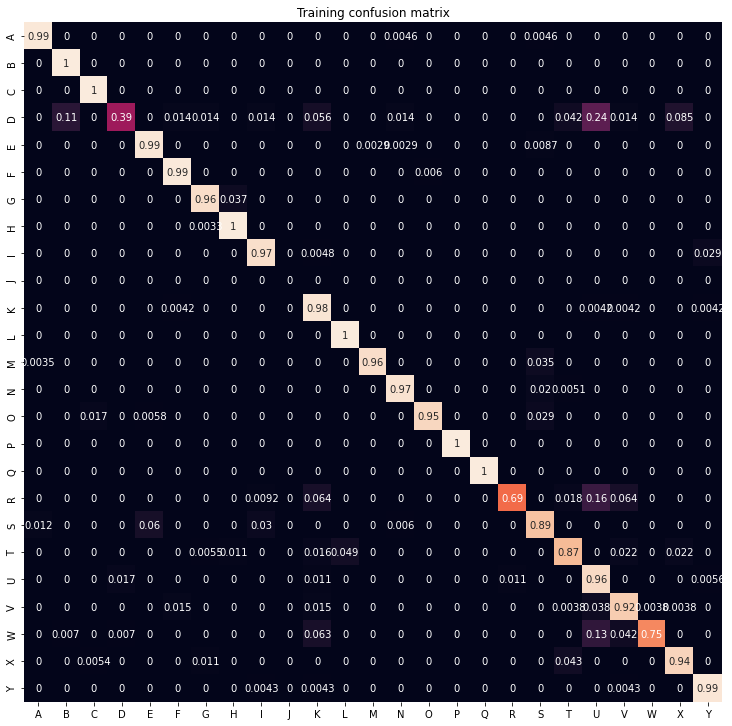

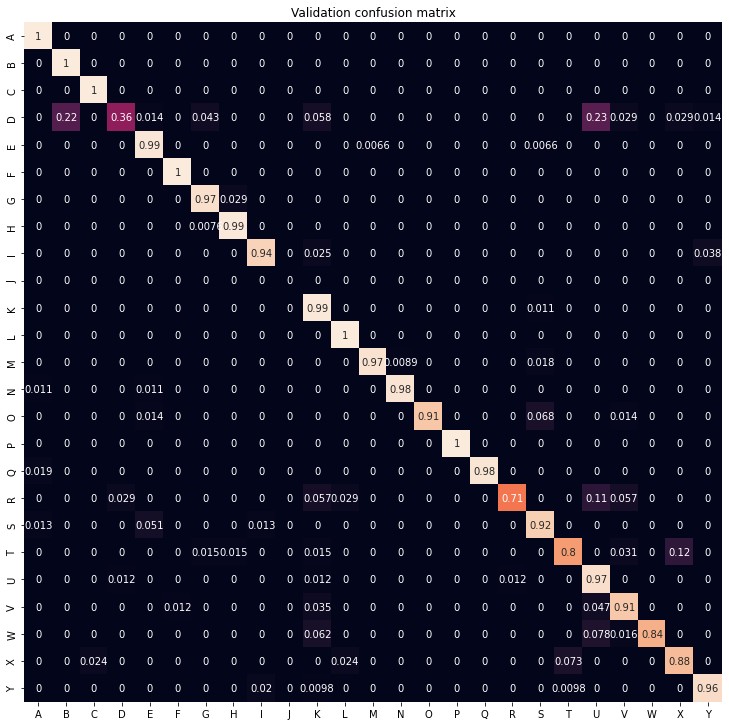

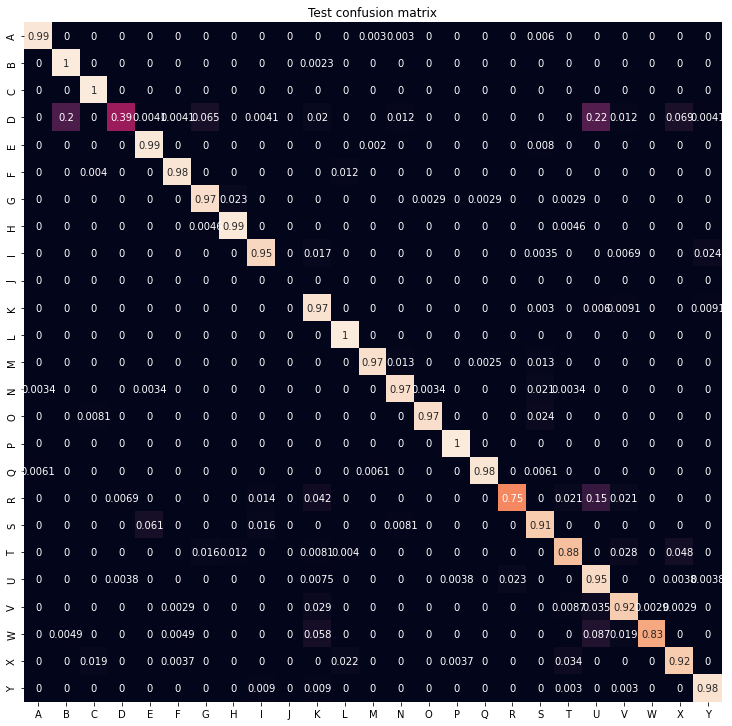

In [ ]:
# Hyperparameters
num_class=25
lr=0.05
batchsize=80
normal_std=0.01
dropout_rate = 0.17

tf.reset_default_graph()

# LAYER 1 
# INPUT = 784 -> 200
image=tf.placeholder(shape=(None,784), dtype=tf.float32, name='Imgaes')

W1=tf.get_variable(shape=(784,200), name='Weight_1',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b1=tf.get_variable(shape=(200), name='Bias_1',
                  initializer=tf.zeros_initializer())

h1=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(image, rate=dropout_rate),W1,name='Hidden_1'))
O1=tf.nn.relu(tf.add(h1,b1, name='Output_1'), name='Relu1')

# LAYER 2
# HIDDEN = 200 -> 200
W2=tf.get_variable(shape=(200,200), name='Weight_2',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b2=tf.get_variable(shape=(200), name='Bias_2',
                  initializer=tf.zeros_initializer())
h2=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(O1, rate=dropout_rate),W2,name='Hidden_2'))
O2=tf.nn.relu(tf.add(h2,b2, name='Output_2'), name='Relu2')

# LAYER 3
# HIDDEN = 200 -> 200
W3=tf.get_variable(shape=(200,200), name='Weight_3',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b3=tf.get_variable(shape=(200), name='Bias_3',
                  initializer=tf.zeros_initializer())
h3=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(O2, rate=dropout_rate),W3,name='Hidden_3'))
O3=tf.nn.relu(tf.add(h3,b3, name='Output_3'), name='Relu3')

# LAYER 4
# HIDDEN = 200 -> 200
W4=tf.get_variable(shape=(200,200), name='Weight_4',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b4=tf.get_variable(shape=(200), name='Bias_4',
                  initializer=tf.zeros_initializer())
h4=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(O3, rate=dropout_rate),W4,name='Hidden_4'))
O4=tf.nn.relu(tf.add(h4,b4, name='Output_4'), name='Relu4')

# LAYER 5
# HIDDEN = 200 -> 25
W5=tf.get_variable(shape=(200,num_class), name='Weight_5',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b5=tf.get_variable(shape=(num_class), name='Bias_5',
                  initializer=tf.zeros_initializer())
h5=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(O1, rate=dropout_rate),W5,name='Hidden_5'))
O5=tf.add(h5,b5, name='Output_5')


output=tf.placeholder(dtype=tf.float32, shape=(None, num_class),
                           name='OUTPUT')

tf.summary.FileWriter('./drive/MyDrive/graphs/unbalanced/sgd_6_dropout_5layer', tf.get_default_graph())

# SGD
loss= tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=output, logits= O5,
                                            name='LOSS'))
sgd=tf.train.GradientDescentOptimizer (
    learning_rate=lr, name='SGD'
).minimize(loss)

# Session Phase
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

# Summerizing the results
write = tf.summary.FileWriter('./drive/MyDrive/graphs/unbalanced/sgd_6_dropout_5layer', sess.graph)

weights1_sum=tf.summary.histogram ('histogram of weights layer 1', W1)
weights2_sum=tf.summary.histogram ('histogram of weights layer 2', W2)
loss_sum1= tf.summary.scalar('Training Loss', loss)
loss_sum2= tf.summary.scalar('Validation Loss', loss)

num_train=x_train_shaffle_unbalanced_normalized.shape[0]

for epoch in range(0,6):
    print('==================================================')
    print('====== Epoch=%s =================================== ' %(epoch))
    print('==================================================')
    for i in range(math.floor(num_train/batchsize)):
        x_temp = x_train_shaffle_unbalanced_normalized[i*batchsize : (i+1)*batchsize]
        x_temp_normalized = (x_temp- np.mean(x_temp, axis=0)) / (1e-3 + np.sqrt(np.var(x_temp, axis=0)))
        f={image:x_temp_normalized,
          output:y_train_shaffle_unbalanced[i*batchsize : (i+1)*batchsize] }
        sess.run(sgd,feed_dict=f)
        print('iter {}: \t Loss={:.4f}'.format(i,sess.run(loss,feed_dict=f)))
    f_valid={image:x_valid_normalized , 
            output:y_valid_hot}
    print('--------------------------------------------------')
    print('Epoch:{} \t Validation Loss:{:.4f} '.format(epoch,sess.run(loss,feed_dict=f_valid)))
    print('--------------------------------------------------')

    # summerize Loss on traing, validation and test, Distrubition of network weights 

    # Training
    f={image:x_train_shaffle_unbalanced_normalized, 
          output:y_train_shaffle_unbalanced}
    write.add_summary(sess.run(loss_sum1, feed_dict=f),epoch)

    # Validation
    f={image:x_valid_normalized, 
          output:y_valid_hot}
    write.add_summary(sess.run(loss_sum2, feed_dict=f),epoch)

    #write.add_summary(sess.run(summaries, tf.summary.scalar('Validation Loss', sess.run(loss,feed_dict=f))),epoch)

    write.add_summary(sess.run(weights1_sum),epoch)
    write.add_summary(sess.run(weights2_sum),epoch)


# Save the trained model
saver = tf.train.Saver()
saver.save(sess, './drive/MyDrive/graphs/unbalanced/sgd_6_dropout_5layer/sgd_model.ckpt')

#Calculate the model accuracy and draw confusion matrix for validation and 
saved_model = saver.restore(sess, './drive/MyDrive/graphs/unbalanced/sgd_6_dropout_5layer/sgd_model.ckpt')

#training data
plt.figure(figsize=(12.5, 12.5))
plt.title('Training confusion matrix')

f = {image: x_train_shaffle_unbalanced_normalized,
     output: y_train_shaffle_unbalanced}

y_train_predicted = np.argmax(sess.run(O5, feed_dict=f), axis=1)
train_accuracy = np.mean(np.where(y_train_shuffle_one_output_unbalanced==y_train_predicted, 1, 0))
print('Train Accuracy = ', train_accuracy)

cm_train = tf.math.confusion_matrix(y_train_shuffle_one_output_unbalanced, y_train_predicted, num_class).eval().astype(np.float64)
cm_train /= cm_train.sum(axis=1)[:,np.newaxis]
cm_train = np.where(np.isnan(cm_train), 0, cm_train)
df = pd.DataFrame(cm_train, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

#validation data
plt.figure(figsize=(12.5, 12.5))
plt.title('Validation confusion matrix')

f = {image: x_valid_normalized,
     output: y_valid_hot}

y_valid_predicted = np.argmax(sess.run(O5, feed_dict=f), axis=1)
valid_accuracy = np.mean(np.where(y_valid==y_valid_predicted, 1, 0))
print('Validation Accuracy = ', valid_accuracy)

cm_valid = tf.math.confusion_matrix(y_valid, y_valid_predicted, num_class).eval().astype(np.float64)
cm_valid /= cm_valid.sum(axis=1)[:,np.newaxis]
cm_valid = np.where(np.isnan(cm_valid), 0, cm_valid)
df = pd.DataFrame(cm_valid, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)


#test data
plt.figure(figsize=(12.5, 12.5))
plt.title('Test confusion matrix')

f = {image: x_test_normalized,
     output: y_test_hot}

y_test_predicted = np.argmax(sess.run(O5, feed_dict=f), axis=1)
test_accuracy = np.mean(np.where(y_test==y_test_predicted, 1, 0))
print('Test Accuracy = ', test_accuracy)

cm_test = tf.math.confusion_matrix(y_test, y_test_predicted, num_class).eval().astype(np.float64)
cm_test /= cm_test.sum(axis=1)[:,np.newaxis]
cm_test = np.where(np.isnan(cm_test), 0, cm_test)
df = pd.DataFrame(cm_test, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

# Part G (Connect the network to webcam)
#### This part is done in cooperation with Ali Arasteh

##Train the best model

INFO:tensorflow:Summary name histogram of weights layer 1 is illegal; using histogram_of_weights_layer_1 instead.
INFO:tensorflow:Summary name histogram of weights layer 2 is illegal; using histogram_of_weights_layer_2 instead.
INFO:tensorflow:Summary name Training Loss is illegal; using Training_Loss instead.
INFO:tensorflow:Summary name Validation Loss is illegal; using Validation_Loss instead.


/tensorflow-1.15.2/python3.7/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


Streaming output truncated to the last 5000 lines.
iter 795: 	 Loss=0.002142
iter 796: 	 Loss=0.000778
iter 797: 	 Loss=0.000084
iter 798: 	 Loss=0.016506
iter 799: 	 Loss=0.003374
iter 800: 	 Loss=0.000003
iter 801: 	 Loss=0.118966
iter 802: 	 Loss=0.000138
iter 803: 	 Loss=0.006706
iter 804: 	 Loss=0.000107
iter 805: 	 Loss=0.000243
iter 806: 	 Loss=0.002683
iter 807: 	 Loss=0.000049
iter 808: 	 Loss=0.000009
iter 809: 	 Loss=0.008839
iter 810: 	 Loss=0.002262
iter 811: 	 Loss=0.000025
iter 812: 	 Loss=0.013500
iter 813: 	 Loss=0.000471
iter 814: 	 Loss=0.000125
iter 815: 	 Loss=0.001171
iter 816: 	 Loss=0.000860
iter 817: 	 Loss=0.000882
iter 818: 	 Loss=0.003745
iter 819: 	 Loss=0.000381
iter 820: 	 Loss=0.000300
iter 821: 	 Loss=0.000568
iter 822: 	 Loss=0.001020
iter 823: 	 Loss=0.019960
iter 824: 	 Loss=0.000046
iter 825: 	 Loss=0.000098
iter 826: 	 Loss=0.002593
iter 827: 	 Loss=0.000007
iter 828: 	 Loss=0.024267
iter 829: 	 Loss=0.000118
iter 830: 	 Loss=0.000666
iter 831: 	 L

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:139: RuntimeWarning: invalid value encountered in true_divide


Test Accuracy =  0.8014500836586727


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:157: RuntimeWarning: invalid value encountered in true_divide


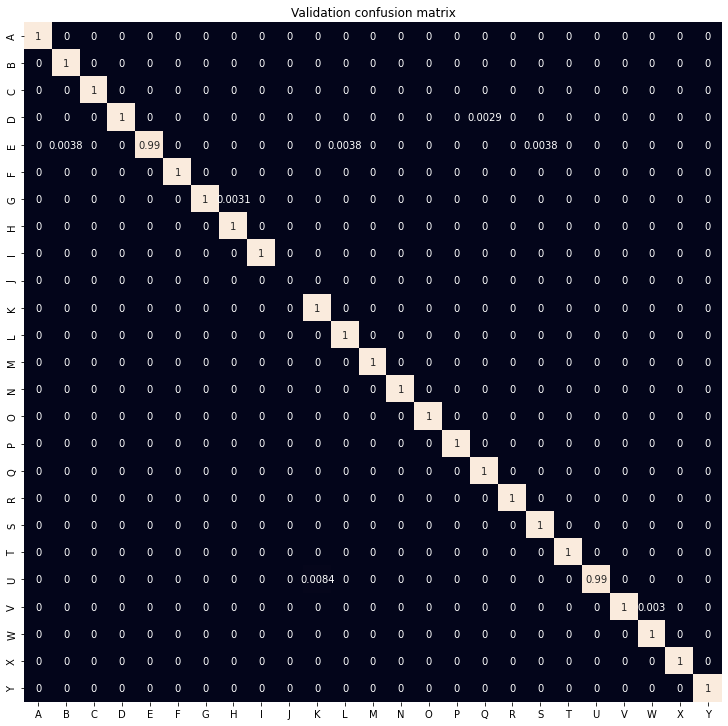

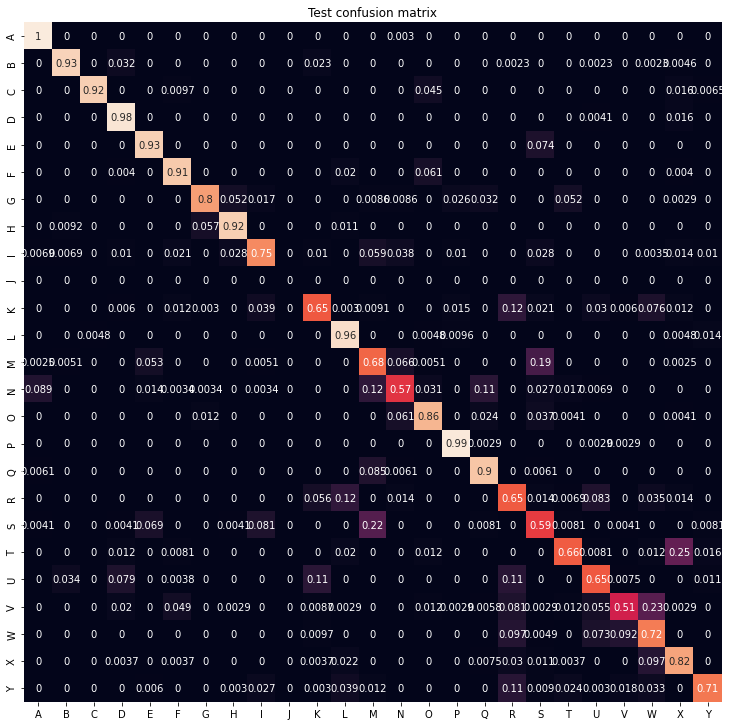

In [ ]:
# Hyperparameters
num_class=25
lr=0.05
batchsize=20
normal_std=0.01
dropout_rate = 0.17

tf.reset_default_graph()

# LAYER 1 
# INPUT = 784 -> 200
image=tf.placeholder(shape=(None,784), dtype=tf.float32, name='Imgaes')

W1=tf.get_variable(shape=(784,200), name='Weight_1',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b1=tf.get_variable(shape=(200), name='Bias_1',
                  initializer=tf.zeros_initializer())

h1=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(image, rate=dropout_rate),W1,name='Hidden_1'))
O1=tf.nn.relu(tf.add(h1,b1, name='Output_1'), name='Relu1')

# LAYER 2
# HIDDEN = 200 -> 200
W2=tf.get_variable(shape=(200,200), name='Weight_2',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b2=tf.get_variable(shape=(200), name='Bias_2',
                  initializer=tf.zeros_initializer())
h2=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(O1, rate=dropout_rate),W2,name='Hidden_2'))
O2=tf.nn.relu(tf.add(h2,b2, name='Output_2'), name='Relu2')

# LAYER 3
# HIDDEN = 200 -> 200
W3=tf.get_variable(shape=(200,200), name='Weight_3',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b3=tf.get_variable(shape=(200), name='Bias_3',
                  initializer=tf.zeros_initializer())
h3=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(O2, rate=dropout_rate),W3,name='Hidden_3'))
O3=tf.nn.relu(tf.add(h3,b3, name='Output_3'), name='Relu3')

# LAYER 4
# HIDDEN = 200 -> 200
W4=tf.get_variable(shape=(200,200), name='Weight_4',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b4=tf.get_variable(shape=(200), name='Bias_4',
                  initializer=tf.zeros_initializer())
h4=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(O3, rate=dropout_rate),W4,name='Hidden_4'))
O4=tf.nn.relu(tf.add(h4,b4, name='Output_4'), name='Relu4')

# LAYER 5
# HIDDEN = 200 -> 25
W5=tf.get_variable(shape=(200,num_class), name='Weight_5',
                  initializer=tf.truncated_normal_initializer(stddev=normal_std))
b5=tf.get_variable(shape=(num_class), name='Bias_5',
                  initializer=tf.zeros_initializer())
h5=tf.layers.batch_normalization(tf.matmul(tf.nn.dropout(O1, rate=dropout_rate),W5,name='Hidden_5'))
O5=tf.add(h5,b5, name='Output_5')


output=tf.placeholder(dtype=tf.float32, shape=(None, num_class),
                           name='OUTPUT')

tf.summary.FileWriter('./drive/MyDrive/graphs/best', tf.get_default_graph())

# SGD
loss= tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=output, logits= O5,
                                            name='LOSS'))
sgd=tf.train.GradientDescentOptimizer(
    learning_rate=lr, name='SGD'
).minimize(loss)

# Session Phase
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

# Summerizing the results
write = tf.summary.FileWriter('./drive/MyDrive/graphs/best', sess.graph)

weights1_sum=tf.summary.histogram ('histogram of weights layer 1', W1)
weights2_sum=tf.summary.histogram ('histogram of weights layer 2', W2)
loss_sum1= tf.summary.scalar('Training Loss', loss)
loss_sum2= tf.summary.scalar('Validation Loss', loss)

num_train=x_train_shaffle.shape[0]

for epoch in range(0,100):
    print('==================================================')
    print('====== Epoch=%s =================================== ' %(epoch))
    print('==================================================')
    for i in range(math.floor(num_train/batchsize)):
        x_temp = x_train_shaffle[i*batchsize : (i+1)*batchsize]
        x_temp_normalized = (x_temp- np.mean(x_temp, axis=0)) / (1e-3 + np.sqrt(np.var(x_temp, axis=0)))
        f={image:x_temp_normalized,
          output:y_train_shaffle[i*batchsize : (i+1)*batchsize] }
        sess.run(sgd,feed_dict=f)
        print('iter {}: \t Loss={:.6f}'.format(i,sess.run(loss,feed_dict=f)))
    f_valid={image:x_valid_normalized , 
            output:y_valid_hot}
    print('--------------------------------------------------')
    print('Epoch:{} \t Validation Loss:{:.6f} '.format(epoch,sess.run(loss,feed_dict=f_valid)))
    print('--------------------------------------------------')

    # summerize Loss on traing, validation and test, Distrubition of network weights 

    # Training
    f={image:x_train_shaffle, 
          output:y_train_shaffle}
    write.add_summary(sess.run(loss_sum1, feed_dict=f),epoch)

    # Validation
    f={image:x_valid_normalized, 
          output:y_valid_hot}
    write.add_summary(sess.run(loss_sum2, feed_dict=f),epoch)

    #write.add_summary(sess.run(summaries, tf.summary.scalar('Validation Loss', sess.run(loss,feed_dict=f))),epoch)

    write.add_summary(sess.run(weights1_sum),epoch)
    write.add_summary(sess.run(weights2_sum),epoch)


# Save the trained model
saver = tf.train.Saver()
saver.save(sess, './drive/MyDrive/graphs/best/adam_model.ckpt')

#Calculate the model accuracy and draw confusion matrix for validation and 
saved_model = saver.restore(sess, './drive/MyDrive/graphs/best/adam_model.ckpt')

#validation data
plt.figure(figsize=(12.5, 12.5))
plt.title('Validation confusion matrix')

f = {image: x_valid_normalized,
     output: y_valid_hot}

y_valid_predicted = np.argmax(sess.run(O5, feed_dict=f), axis=1)
valid_accuracy = np.mean(np.where(y_valid==y_valid_predicted, 1, 0))
print('Validation Accuracy = ', valid_accuracy)

cm_valid = tf.math.confusion_matrix(y_valid, y_valid_predicted, num_class).eval().astype(np.float64)
cm_valid /= cm_valid.sum(axis=1)[:,np.newaxis]
cm_valid = np.where(np.isnan(cm_valid), 0, cm_valid)
df = pd.DataFrame(cm_valid, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)


#test data
plt.figure(figsize=(12.5, 12.5))
plt.title('Test confusion matrix')

f = {image: x_test_normalized,
     output: y_test_hot}

y_test_predicted = np.argmax(sess.run(O5, feed_dict=f), axis=1)
test_accuracy = np.mean(np.where(y_test==y_test_predicted, 1, 0))
print('Test Accuracy = ', test_accuracy)

cm_test = tf.math.confusion_matrix(y_test, y_test_predicted, num_class).eval().astype(np.float64)
cm_test /= cm_test.sum(axis=1)[:,np.newaxis]
cm_test = np.where(np.isnan(cm_test), 0, cm_test)
df = pd.DataFrame(cm_test, index = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"], columns = [i for i in "ABCDEFGHIJKLMNOPQRSTUVWXY"])
sn.heatmap(df, annot=True, cbar=False)

## Connect using Javascript and eval_js in google colab

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode
from io import BytesIO
from PIL import Image
import cv2

def take_photo(quality=1):
  js = Javascript('''
    async function takePhoto(quality) {
      const video = document.createElement('video');
      const stream = await navigator.mediaDevices.getUserMedia({video: true});
      video.srcObject = stream;
      await video.play();
      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth
      canvas.height = video.videoHeight
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      return canvas.toDataURL();
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  print(data)
  img_bytes = b64decode(data.split(',')[1])
  img = Image.open(BytesIO(img_bytes))
  img = np.array(img)
  img = img[0:400, 0:400, :]
  img = cv2.resize(img, dsize=(28, 28))
  gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  return gray_img

In [ ]:
from IPython.display import HTML, Audio
from google.colab.output import eval_js
from base64 import b64decode
import numpy as np
import io
from PIL import Image

VIDEO_HTML = """
<div class="video_container">
  <video autoplay
   width=%d height=%d></video>
</div>
<script>
var video = document.querySelector('video')
navigator.mediaDevices.getUserMedia({ video: true })
  .then(stream=> video.srcObject = stream)
  
function data (){
    var canvas = document.createElement('canvas')
    var [w,h] = [video.offsetWidth, video.offsetHeight]
    canvas.width = w
    canvas.height = h
    canvas.getContext('2d')
          .drawImage(video, 0, 0, w, h)
    return canvas.toDataURL('image/jpeg', %f)
  }
</script>
"""

def stream(filename=None, quality=1, size=(640, 480)):
  handle = display(HTML(VIDEO_HTML % (size[0],size[1],quality)), display_id='videoHTML')

stream()

<IPython.core.display.Javascript object>


INFO:tensorflow:Restoring parameters from ./drive/MyDrive/graphs/best/adam_model.ckpt
[[ -9336.469   -11837.111   -14713.896   -13742.952   -14400.191
    5723.5884   -9836.699     -752.14825   1008.3945   -4272.728
  -10260.593      274.51697  -9539.309    -8706.505    -1803.6466
    2301.1904   -7353.307   -13408.239    -2860.8774     706.6814
  -19814.463    -5410.8447   -3312.4744   -2129.5515   -2251.387  ]]
F

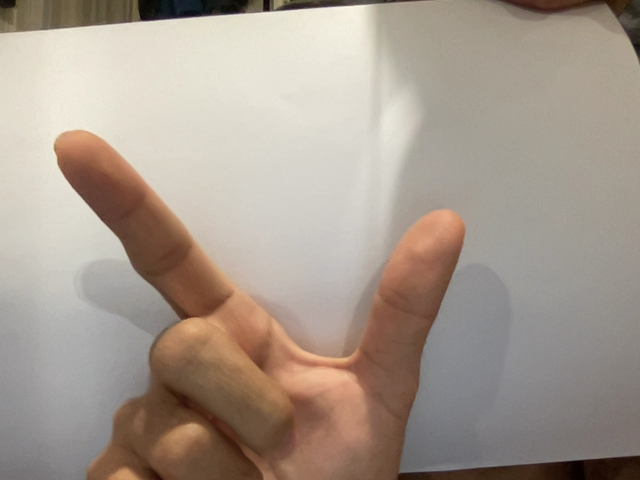

In [ ]:
gray_img = take_photo()
gray_img = (gray_img.reshape(1, -1) - np.mean(x_train, axis=0)) / (1e-3 + np.sqrt(np.var(x_train, axis=0)))

saved_model = saver.restore(sess, './drive/MyDrive/graphs/best/adam_model.ckpt') # You can load any model

f = {image: gray_img,
    output: y_valid_hot}

predicted_y = sess.run(O5, feed_dict=f)
print(predicted_y)
print(chr(np.argmax(predicted_y, axis=1) + 65))



## Connect using cv2.VideoCapture (Just in Jupyter)

In [ ]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import cv2
import scipy
vid = cv2.VideoCapture(0)

saved_model = saver.restore(sess, './drive/MyDrive/graphs/sgd/sgd_model.ckpt') # You can load any model

while(True): 
  ret, frame = vid.read()
  frame = frame[0:400, 0:400, :]
  img = cv2.resize(frame, dsize=(28, 28))
  gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  gray_img = (gray_img.reshape(1, -1) - np.mean(x_train.to_numpy(), axis=0)) / (1e-3 + np.sqrt(np.var(x_train.to_numpy(), axis=0)))
  
  f = {image: gray_img,
     output: y_valid_hot}

  predicted_y = sess.run(O2, feed_dict=f)
  
  
  cv2.putText(frame, chr(int(np.argmax(predicted_y, axis=1)) + 65) + ': ' + str(scipy.special.softmax(predicted_y)[0][int(np.argmax(predicted_y, axis=1))]), (5, 25), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2, cv2.LINE_AA)
  cv2.imshow('frame', frame)
  if cv2.waitKey(1) & 0xFF == ord('q'):
    cv2.imwrite(chr(int(np.argmax(predicted_y, axis=1)) + 65) + '.jpg', frame)
    break

vid.release()
cv2.destroyAllWindows()

INFO:tensorflow:Restoring parameters from ./drive/MyDrive/graphs/sgd/sgd_model.ckpt


TypeError: ignored